# 6 months prediction using Selected Features
#### Name: Xiaoyu Wu 
#### Student ID : 1218098

---

#### This file contains:

* Prediction for 2019.07-2019.12 (second half of 2019) using data from 2008-2019.06

In [1]:
import pandas as pd
import numpy as np
import csv
import seaborn as sns
from time import strptime

import matplotlib.pyplot as plt

import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from xgboost import plot_importance, plot_tree
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from BorutaShap import BorutaShap
import missingno as msno

#!pip install shap
import shap
shap.initjs()

## Load data

In [2]:
# load data

# loaded data with index and has "month" column
combined_data1 = pd.read_csv("./data/old_08-19_combined.csv")
# loaded data without index and has no "month" column
combined_data = pd.read_csv("./data/old_08-19_combined.csv", index_col = [0])

combined_data.index = pd.to_datetime(combined_data.index)
combined_data1["month"] = pd.to_datetime(combined_data1["month"])

print(combined_data.shape)
print(combined_data1.shape)


#Check number of rows and columns, type of each columns
#combined_data.info()
#combined_data1.info()

(144, 79)
(144, 80)


<AxesSubplot:>

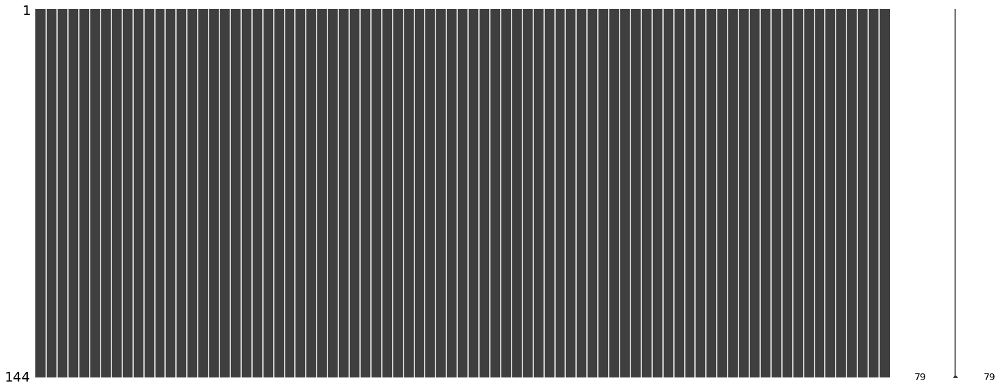

In [3]:
msno.matrix(combined_data)

In [4]:
# Understanding the numeric fields
combined_data.describe()

,aus_population_natural_increase,aus_population_overseas_arrivals,aus_population_net overseas migration,aus_population_estimated resident population,aus_beef&veal_slaughterings,aus_beef&veal_average weight,aus_beef&veal_production,aus_beef&veal_exports,aus_apparent consumption,australia cattle numbers,...,us_fed_avg_dressed_cows,us_fed_avg_dressed_bulls and stags,us_fed_avg_dressed_calves,us_cold_storage_beef,us_cold_storage_veal,us_veganism,us_beef,us_veganism_trend_ratio,us_imports_from_aus,import_ratio
count,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,...,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000,144.000000
mean,12.754167,40.662500,18.850000,23286.761806,711.716667,22.079167,188.258333,134.287500,53.920833,27122.916667,...,624.409722,886.604167,151.423611,454.113194,7.469444,44.625000,44.618056,0.478333,62113.619792,0.272014
std,1.007029,6.868158,5.537034,1287.157760,57.914009,0.863225,14.230792,15.806495,4.503889,1531.622530,...,19.559275,18.250862,17.283559,41.903710,4.346448,22.570441,10.978043,0.080740,24448.997524,0.070726
min,10.100000,15.100000,10.100000,21016.100000,618.400000,20.500000,172.400000,114.800000,42.500000,24723.000000,...,579.000000,851.000000,117.000000,346.560000,2.330000,18.000000,25.000000,0.320000,13954.000000,0.100000
25%,12.100000,36.725000,14.200000,22166.825000,671.075000,21.700000,176.900000,120.300000,49.800000,26176.000000,...,607.750000,874.000000,140.000000,428.020000,4.100000,28.750000,36.750000,0.420000,47098.750000,0.227500
50%,12.750000,40.600000,17.950000,23284.850000,710.050000,22.100000,186.500000,128.300000,54.400000,27367.000000,...,625.500000,884.500000,148.000000,457.820000,6.145000,35.000000,43.000000,0.460000,56450.000000,0.260000
75%,13.400000,44.250000,23.325000,24367.275000,727.300000,22.500000,196.000000,147.400000,57.800000,28440.000000,...,638.000000,898.000000,162.250000,482.990000,8.692500,59.000000,53.000000,0.550000,70357.500000,0.310000
max,14.700000,54.200000,31.100000,25523.900000,842.100000,23.600000,221.800000,167.400000,60.400000,29291.000000,...,666.000000,934.000000,200.000000,567.890000,21.160000,100.000000,74.000000,0.670000,137916.000000,0.490000


- Here as you can notice mean value is more than median value of most columns which is represented by 50%(50th percentile) in index column.

- There is notably a big difference between 75th percentile and max values of certain fields like “First hand sales quantity”,”First hand sales amount”,”Total completions” etc.

- Thus observations 1 and 2 suggests that there are extreme values-Outliers in our data set. We get the same conclusion once we look at the histograms of all the numeric fields.

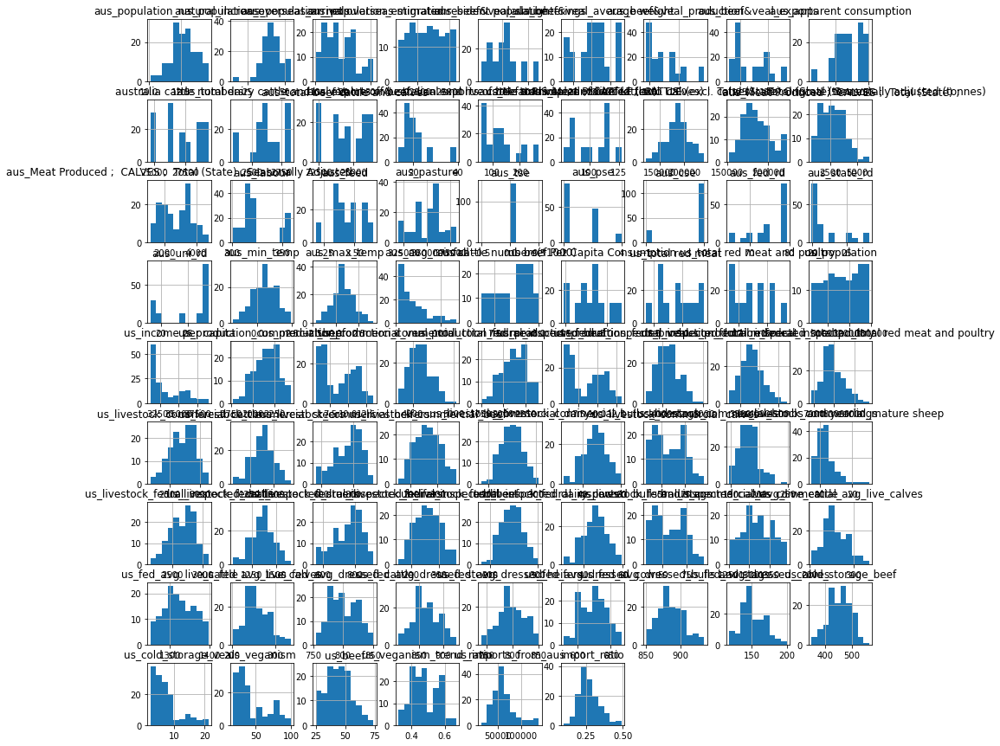

In [5]:
# Histogram of all numeric fields
df_hist = combined_data
df_hist.hist(figsize=(15,15));

## Checking time series properties of target variable y


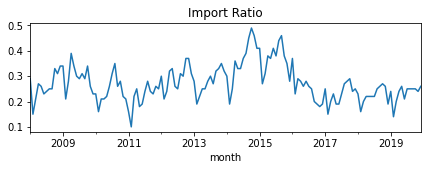

In [6]:
# plot the import ratio trend
_ = combined_data['import_ratio'].plot(figsize=(7, 2),title='Import Ratio')

#color_pal = ["#F8766D", "#D39200", "#93AA00", "#00BA38", "#00C19F", "#00B9E3", "#619CFF", "#DB72FB"]
#_ = only_y.plot(style='.', figsize=(15,5), color=color_pal[0], title='Import Ratio')



In [7]:
# check if stationary
from statsmodels.tsa.stattools import adfuller
from numpy import log
result = adfuller(combined_data.import_ratio.dropna())
print('p-value: %f' % result[1])

# 0.164061
#Since the p-value is over 0.05, the data is not stationary

p-value: 0.164061


### Decomposition

For selecting the right model is to see in our plot if the trend and seasonal variation are relatively constant over time, in other words, linear. If yes, then we will select the Additive model. Otherwise, if the trend and seasonal variation increase or decrease over time then we use the Multiplicative model.

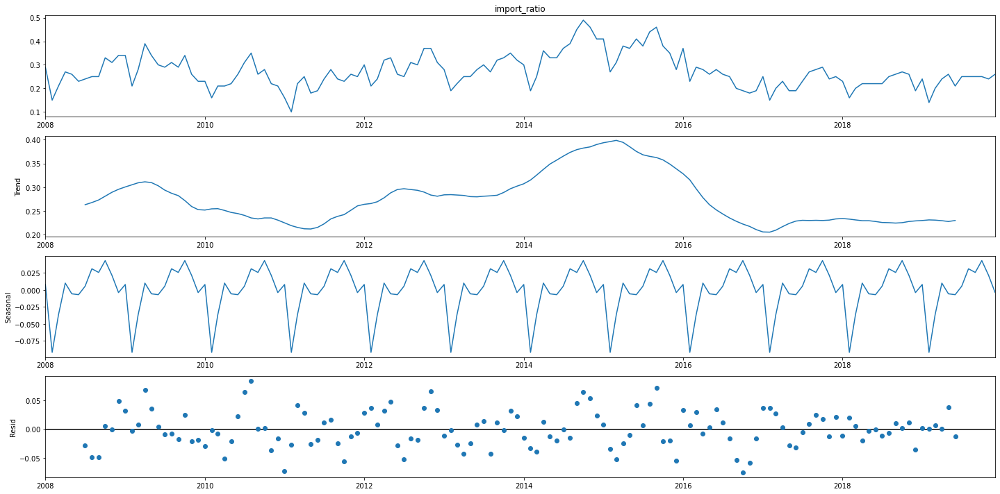

In [9]:
result=seasonal_decompose(combined_data['import_ratio'], model='Additive', period=12)
plt.rcParams['figure.figsize'] = (20.0, 10.0)
result.plot()
plt.show()

We have used the additive model for decomposition which assumes that the time series data is structured in the following manner:

Time Series Data = Trend + Seasonal + Random

We can observe that the seasonal pattern is a regularly repeating pattern and that the trend is not a smooth line.

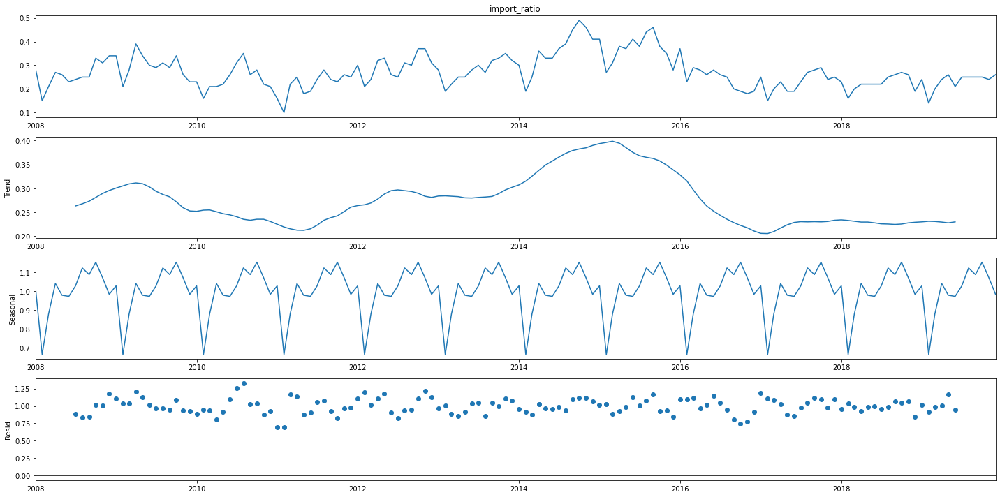

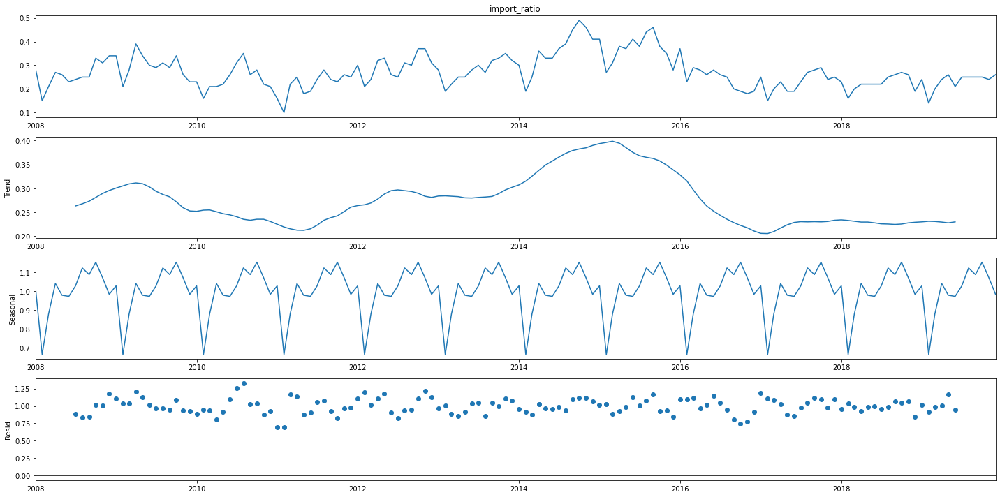

In [10]:
import matplotlib.pyplot
result=seasonal_decompose(combined_data['import_ratio'], model='multiplicable', period=12)
result.plot()
plt.rcParams['figure.figsize'] = (20.0, 10.0)
result.plot()
plt.show()

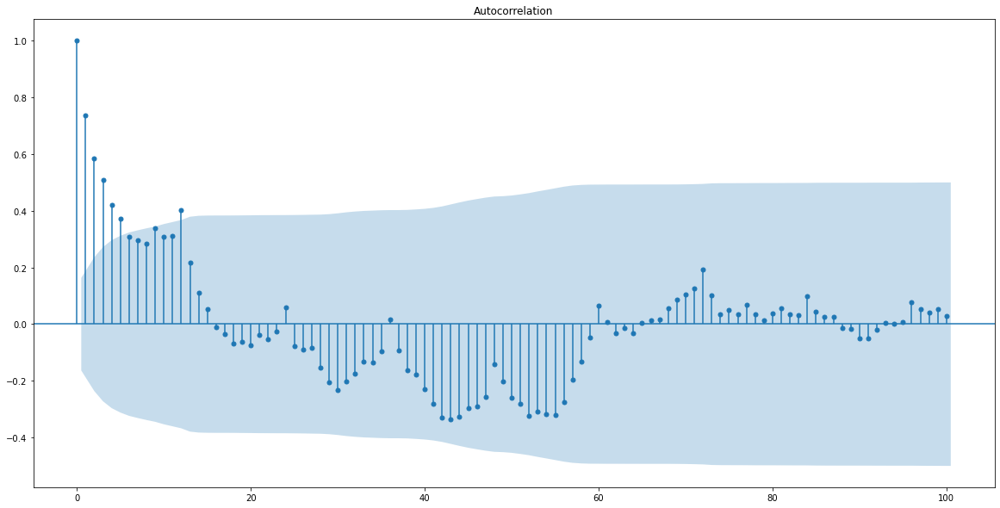

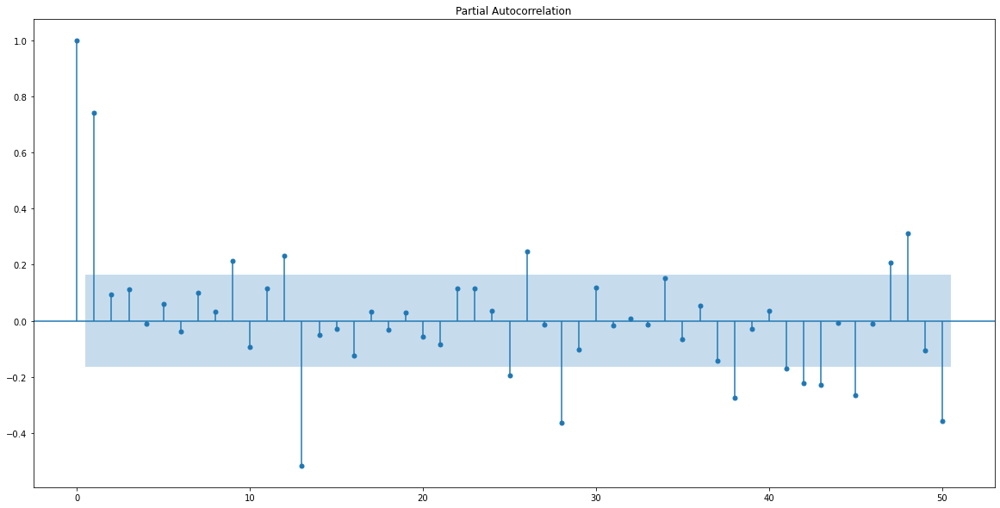

In [12]:
# ACF Plot of Target Variable
from statsmodels.tsa.stattools import pacf
import statsmodels.api
#import statsmodels.graphics.tsaplots.plot_acf
statsmodels.graphics.tsaplots.plot_acf(combined_data['import_ratio'],lags= 100)
plt.show()

# PACF plot of target variable
statsmodels.graphics.tsaplots.plot_pacf(combined_data['import_ratio'], lags=50)
plt.show()

The dataset is non-stationary as can be seen from the ACF and PACF plots

## Outlier Detection


In [8]:
# check the col number of colname
out = np.argwhere(combined_data.columns.isin(['total_us_imports', 'us_imports_from_aus', "us_livestock_commercial_steers"])).ravel()
print(out)

out = np.argwhere(combined_data1.columns.isin(['total_us_imports', 'us_imports_from_aus', "us_livestock_commercial_steers"])).ravel()
print(out)


[46 76 77]
[47 77 78]


<AxesSubplot:>

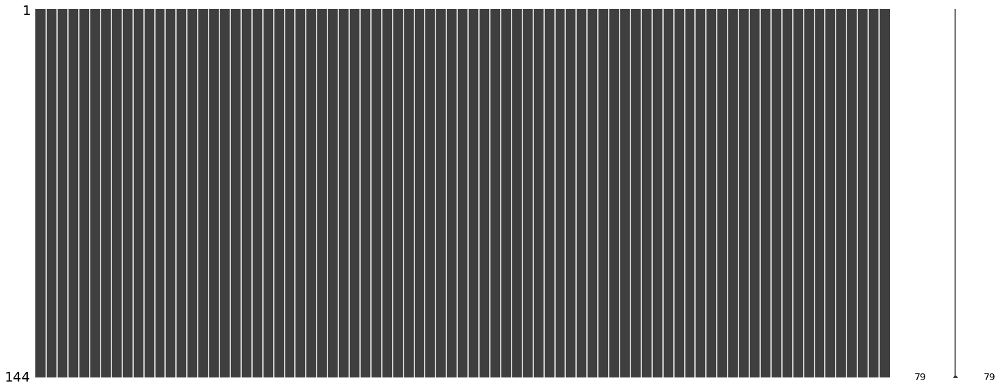

In [9]:
msno.matrix(combined_data)

#### Change column type

In [11]:
# steer and us_import got object type, so we need to convert it to float which is a type we need for later
combined_data["us_livestock_commercial_steers"] = pd.to_numeric(combined_data.us_livestock_commercial_steers, errors='coerce')
#combined_data["us_livestock_commercial_steers"]
combined_data["total_us_imports"] = pd.to_numeric(combined_data.total_us_imports, errors='coerce')
#combined_data["total_us_imports"]

combined_data1["us_livestock_commercial_steers"] = pd.to_numeric(combined_data1.us_livestock_commercial_steers, errors='coerce')
#combined_data["us_livestock_commercial_steers"]
combined_data1["total_us_imports"] = pd.to_numeric(combined_data1.total_us_imports, errors='coerce')
#combined_data["total_us_imports"]

# get the col type
a = combined_data.columns.to_series().groupby(combined_data.dtypes).groups
#print(a)
b = combined_data1.columns.to_series().groupby(combined_data1.dtypes).groups
#b


# check a specific col type
#c = combined_data.iloc[:,45:48]
#c.dtypes



In [16]:
# Outlier Detection using Inter Quartile Range
def out_iqr(s, k=1.5, return_thresholds=False):
    """
    Return a boolean mask of outliers for a series
    using interquartile range, works column-wise.
    param k:
        some cutoff to multiply by the iqr
    :type k: ``float``
    param return_thresholds:
        True returns the lower and upper bounds, good for plotting.
        False returns the masked array 
    :type return_thresholds: ``bool``
    """
    # calculate interquartile range
    q25, q75 = np.percentile(s, 25), np.percentile(s, 75)
    iqr = q75 - q25
    # calculate the outlier cutoff
    cut_off = iqr * k
    lower, upper = q25 - cut_off, q75 + cut_off
    if return_thresholds:
        return lower, upper
    else: # identify outliers
        return [True if x < lower or x > upper else False for x in s]
    
    
# For comparison, make one array each at varying values of k.
df1 = combined_data
df2 = combined_data1.drop(columns=['month'],axis=1)
df1 = df1
df2 = df2

iqr1 = df1.apply(out_iqr, k=1.5)
iqr2 = df2.apply(out_iqr, k=1.5)

iqr1.to_csv("out.csv")

#iqr1.head(10)
#iqr2.head(10)

In [18]:
#combined_data1.tail(30)

ab, ah, bc, bv, ca, f, n, u,z has large amount of outliers

### Outlier treatment


In [19]:
for column in df1:
    df1[column] = np.where(iqr1[column] == True,'NaN',df1[column])
cols = df1.columns
df1[cols] = df1[cols].apply(pd.to_numeric, errors='coerce')


for column in df2:
    df2[column] = np.where(iqr1[column] == True,'NaN',df2[column])
cols = df2.columns
df2[cols] = df2[cols].apply(pd.to_numeric, errors='coerce')

#df1.tail(30)
#df2.tail(30)

All the identified outliers are replaced by nulls first.

In [21]:
#Use linear interpolation to fill up nulls
no_month_df = df1.interpolate(method='linear', axis=0).bfill().ffill()

month_df = df2.interpolate(method='linear', axis=0).bfill().ffill()
combined_data1['month'] = pd.to_datetime(combined_data1['month'])
month_df = pd.concat([combined_data1['month'],month_df], axis=1)

#no_month_df.tail(30)
#no_month_df.head(5)
#month_df.head(5)
#month_df.tail(30)
#month_df.to_csv("no_outlier.csv")

#month_df.info()

<AxesSubplot:>

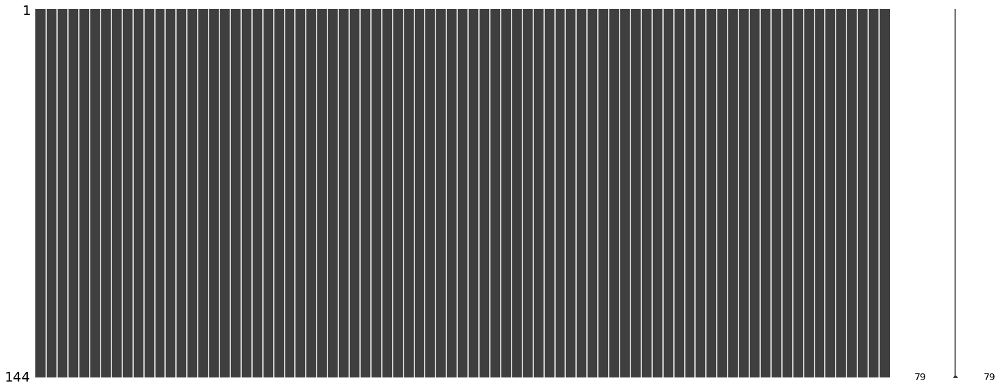

In [23]:
msno.matrix(no_month_df)

## Feature Engineering

refers to the process of creating new variables from existing ones which capture hidden business insights

### Lag features 
- are values at prior time steps
- the features have a lagged impact on the target variable
- The best way to find the optimal number of lags to chose for each field is to look at cross correlation graphs.
- Cross correlation graphs show the correlation between the target variable with various lags of raw features

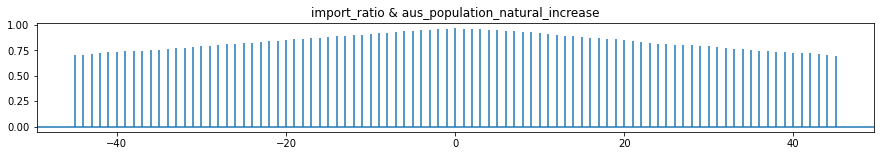

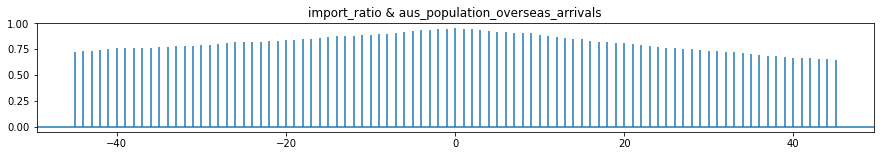

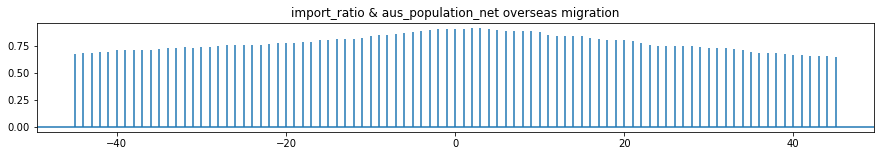

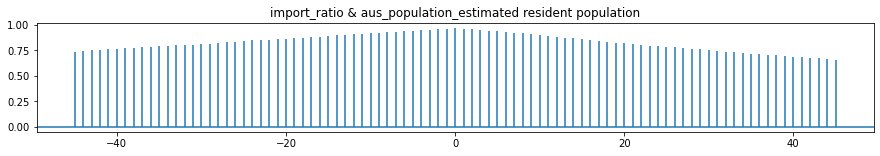

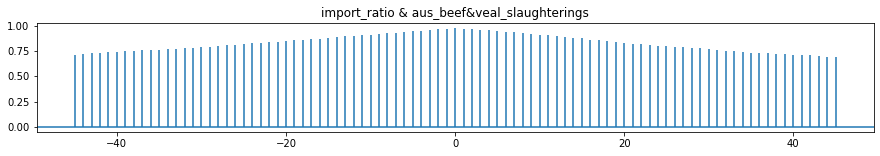

...

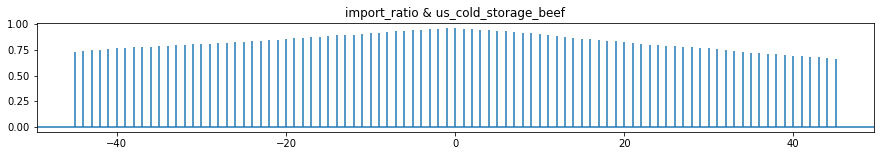

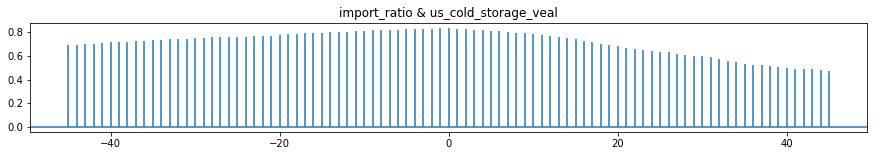

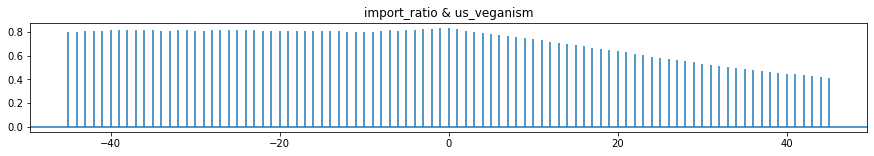

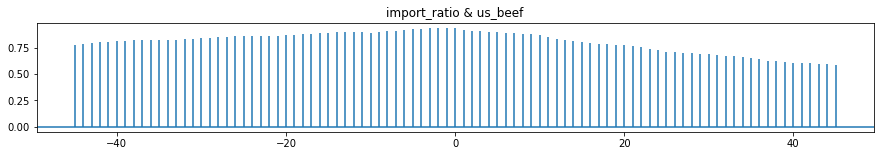

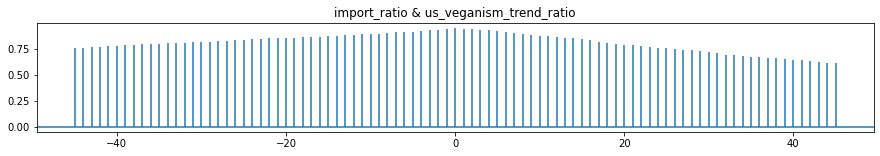

In [26]:
# Check Optimal Number of Lags
for i in range(len(no_month_df.columns)-3):
    plt.figure(i, figsize=(15,2)) # add this statement before your plot
    plt.xcorr(no_month_df.iloc[:,78],no_month_df.iloc[:,i],maxlags=45, usevlines=1)
    plt.title(no_month_df.columns[78] + ' & '+ no_month_df.columns[i])
    plt.show()

In [24]:
def lag_feature(df, lags, new_df_col, target_col):
    tmp = df[new_df_col]
    for i in lags:
        tmp[target_col+'_lag_'+str(i)] = df[target_col].shift(i)
    
    tmp[target_col] = df[target_col]
    return tmp

def fill_na(df):
    for col in df.columns:
        if ('_lag_' in col) & (df[col].isnull().any()):
            df[col].fillna(0, inplace=True)         
    return df

In [28]:
# create lag features

df = combined_data
new_df_col = df.columns[:-3]
target_col = 'import_ratio'

combined_data_lag = lag_feature(df, [1,2,3], new_df_col, target_col)

combined_data_lag = fill_na(combined_data_lag)
combined_data_lag



df1 = combined_data1
new_df_col1 = ['month']
tmp_name = df.columns[:-3]
for i in range(len(tmp_name)):
    new_df_col1.append(tmp_name[i])

target_col1 = 'import_ratio'

combined_data1_lag = lag_feature(df1, [1,2,3], new_df_col1, target_col1)
combined_data1_lag = fill_na(combined_data1_lag)
combined_data1_lag


,month,aus_population_natural_increase,aus_population_overseas_arrivals,aus_population_net overseas migration,aus_population_estimated resident population,aus_beef&veal_slaughterings,aus_beef&veal_average weight,aus_beef&veal_production,aus_beef&veal_exports,aus_apparent consumption,...,us_fed_avg_dressed_calves,us_cold_storage_beef,us_cold_storage_veal,us_veganism,us_beef,us_veganism_trend_ratio,import_ratio_lag_1,import_ratio_lag_2,import_ratio_lag_3,import_ratio
0,2008-01-01,14.0,48.9,31.1,21016.1,722.7,20.5,177.7,120.0,57.2,...,159,482.51,7.46,33,34,0.49,0.00,0.00,0.00,0.29
1,2008-02-01,14.0,48.9,31.1,21060.4,722.7,20.5,177.7,120.0,57.2,...,160,450.78,6.59,49,33,0.60,0.29,0.00,0.00,0.15
2,2008-03-01,14.0,48.9,31.1,21104.6,722.7,20.5,177.7,120.0,57.2,...,160,436.55,6.11,40,40,0.50,0.15,0.29,0.00,0.21
3,2008-04-01,12.6,39.4,21.7,21148.9,722.7,20.5,177.7,120.0,57.2,...,164,426.71,5.75,32,27,0.54,0.21,0.15,0.29,0.27
4,2008-05-01,12.6,39.4,21.7,21182.3,722.7,20.5,177.7,120.0,57.2,...,162,416.35,6.33,25,26,0.49,0.27,0.21,0.15,0.26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,2019-08-01,10.8,54.2,24.8,25401.3,724.9,22.8,197.7,155.1,42.5,...,117,454.46,4.72,80,56,0.59,0.25,0.21,0.26,0.25
140,2019-09-01,10.8,54.2,24.8,25436.8,724.9,22.8,197.7,155.1,42.5,...,123,469.88,5.39,75,57,0.57,0.25,0.25,0.21,0.25
141,2019-10-01,11.4,50.7,14.3,25472.4,724.9,22.8,197.7,155.1,42.5,...,127,468.98,5.73,80,64,0.56,0.25,0.25,0.25,0.25
142,2019-11-01,11.4,50.7,14.3,25498.1,724.9,22.8,197.7,155.1,42.5,...,130,466.27,5.66,100,63,0.61,0.25,0.25,0.25,0.24


## Now we have the data ready for modeling


## Train/Test Split
### Cut off the data after 2019.6 to use as our test set.



<AxesSubplot:>

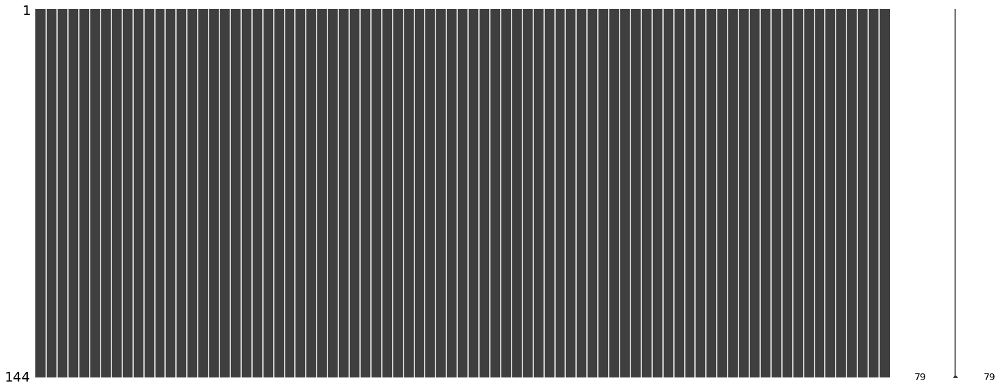

In [25]:
msno.matrix(no_month_df)

In [30]:
### All features
## Has outlier
# no month: combine_data
test_df = combined_data.iloc[138:144,:]
train_df = combined_data.iloc[:138,:]
X_train, y_train = train_df.iloc[:,:76], train_df.iloc[:,78]
X_test, y_test = test_df.iloc[:,:76], test_df.iloc[:,78]

# Scale the features
#X_train = StandardScaler().fit_transform(X_train)
#X_test = StandardScaler().fit_transform(X_test)

# has month: combine_data1
test_df1 = combined_data1.iloc[138:144,:]
train_df1 = combined_data1.iloc[:138,:]
X_train1, y_train1 = train_df1.iloc[:,:77], train_df1.iloc[:,79]
X_test1, y_test1 = test_df1.iloc[:,:77], test_df1.iloc[:,79]


## NO outlier
# no outlier no month: combine_data
test_no_outlier = no_month_df.iloc[138:144,:]
train_no_outlier = no_month_df.iloc[:138,:]
X_train_no_outlier, y_train_no_outlier = train_no_outlier.iloc[:,:76], train_no_outlier.iloc[:,78]
X_test_no_outlier, y_test_no_outlier = test_no_outlier.iloc[:,:76], test_no_outlier.iloc[:,78]

# Scale the features
#X_train_no_outlier = StandardScaler().fit_transform(X_train_no_outlier)
#X_test_no_outlier = StandardScaler().fit_transform(X_test_no_outlier)

# no outlier has month: combine_data
test_no_outlier1 = month_df.iloc[138:144,:]
train_no_outlier1 = month_df.iloc[:138,:]
X_train_no_outlier1, y_train_no_outlier1 = train_no_outlier1.iloc[:,:77], train_no_outlier1.iloc[:,79]
X_test_no_outlier1, y_test_no_outlier1 = test_no_outlier1.iloc[:,:77], test_no_outlier1.iloc[:,79]


# output the train & test data
test_df.to_csv("6m_test.csv")
train_df.to_csv("6m_train.csv")

#print(test_df)
#y_train1
test_df
#test_df1
#X_train_no_outlier.info()

,aus_population_natural_increase,aus_population_overseas_arrivals,aus_population_net overseas migration,aus_population_estimated resident population,aus_beef&veal_slaughterings,aus_beef&veal_average weight,aus_beef&veal_production,aus_beef&veal_exports,aus_apparent consumption,australia cattle numbers,...,us_fed_avg_dressed_bulls and stags,us_fed_avg_dressed_calves,us_cold_storage_beef,us_cold_storage_veal,us_veganism,us_beef,us_veganism_trend_ratio,total_us_imports,us_imports_from_aus,import_ratio
month,,,,,,,,,,,,,,,,,,,,,
2019-07-01,10.8,54.2,24.8,25365.7,724.9,22.8,197.7,155.1,42.5,24723,...,883,117.0,405.65,4.26,74,53,0.58,267052.0,67910.0,0.25
2019-08-01,10.8,54.2,24.8,25401.3,724.9,22.8,197.7,155.1,42.5,24723,...,884,117.0,454.46,4.72,80,56,0.59,265778.0,66343.0,0.25
2019-09-01,10.8,54.2,24.8,25436.8,724.9,22.8,197.7,155.1,42.5,24723,...,878,123.0,469.88,5.39,75,57,0.57,238163.0,60376.0,0.25
2019-10-01,11.4,50.7,14.3,25472.4,724.9,22.8,197.7,155.1,42.5,24723,...,855,127.0,468.98,5.73,80,64,0.56,241022.0,59710.0,0.25
2019-11-01,11.4,50.7,14.3,25498.1,724.9,22.8,197.7,155.1,42.5,24723,...,859,130.0,466.27,5.66,100,63,0.61,242413.0,58570.0,0.24
2019-12-01,11.4,50.7,14.3,25523.9,724.9,22.8,197.7,155.1,42.5,24723,...,851,131.0,478.26,5.46,96,69,0.58,228310.0,59404.0,0.26


We tune a set of 8 parameters for this model: 
- number of gradient boosted trees, 
- maximum tree depth for base learners, 
- boosting learning rate, 
- minimum loss reduction required to make a further partition on a leaf node 
- minimum sum of weights of all observations required in a child node
- subsample
- colsample_bytree

In [26]:
xgb_Test_Accuracy_Data = pd.DataFrame(columns = ['outlier','n_estimators','max_depth','min_child_weight',
                                                 'gamma','learning_rate','subsample','colsample_bytree',
                                                 'eta','Train Accurcay','Test Accurcay', 'RMSE','MAE'])

### Modeling for data contains outlier
- all features

- all + lag features

- only selected

In [32]:
outlier = 'all_yes'

## Parameter Setting

# Number of trees
n_estimators = 1113

# Maximum number of levels in tree
max_depth = 14

#minimum sum of weights of all observations required in a child
min_child_weight = 8

#Gamma specifies the minimum loss reduction required to make a split
gamma = 0

# boosting learning rate
learning_rate = 0.317543
subsample = 0.526417 # 80% of data to grow trees and prevent overfitting
colsample_bytree = 0.945957  # 85% of features used
eta = 0.1
seed = 517  # for reproducible results

#xgb_reg = XGBRegressor(n_estimators=n_estimators, learning_rate=learning_rate,
#                       max_depth = max_depth, min_child_weight = min_child_weight,
#                       gamma = gamma, subsample = subsample, colsample_bytree = colsample_bytree,
#                       eta = eta, seed = seed)

xgb_reg = XGBRegressor()
#Fit the regressor to the training set
model_all_yes= xgb_reg.fit(X_train, y_train)

#evaluation = [(X_train, y_train), (X_test, y_test)]
#model_all_yes = xgb_reg.fit(X_train, y_train,
#            eval_set=evaluation, eval_metric="rmse",
#            early_stopping_rounds=10,verbose=False)


# Train Data
# Use the forest's predict method on the train data
predictions_train = xgb_reg.predict(X_train)

# Calculate the absolute errors
errors_train = abs(predictions_train - y_train)

# Calculate mean absolute percentage error (MAPE)
mape_train = 100 * (errors_train/ y_train)
            
# Calculate and display accuracy
accuracy_train = 100 - np.mean(mape_train)

# Test Data
# Use the forest's predict method on the test data
predictions_test = xgb_reg.predict(X_test)

# Calculate the absolute errors
errors_test = abs(predictions_test - y_test)

# Calculate mean absolute percentage error (MAPE)
mape_test = 100 * (errors_test/ y_test)

# Calculate and display accuracy
accuracy_test = 100 - np.mean(mape_test)


xgb_Test_Accuracy_Data_One = pd.DataFrame(index = range(1),columns = ['outlier','n_estimators','max_depth',
                                                                      'min_child_weight','gamma',
                                                                      'learning_rate','subsample',
                                                                      'colsample_bytree','eta',
                                                                      'Train Accurcay',
                                                                      'Test Accurcay', 'RMSE','MAE'])

xgb_Test_Accuracy_Data_One.loc[:,'outlier'] = outlier
xgb_Test_Accuracy_Data_One.loc[:,'n_estimators'] = n_estimators
xgb_Test_Accuracy_Data_One.loc[:,'max_depth'] = max_depth
xgb_Test_Accuracy_Data_One.loc[:,'min_child_weight'] = min_child_weight            
xgb_Test_Accuracy_Data_One.loc[:,'gamma'] = gamma
xgb_Test_Accuracy_Data_One.loc[:,'learning_rate'] = learning_rate
xgb_Test_Accuracy_Data_One.loc[:,'subsample'] = subsample       
xgb_Test_Accuracy_Data_One.loc[:,'colsample_bytree'] = colsample_bytree
xgb_Test_Accuracy_Data_One.loc[:,'eta'] = eta                                                                    
xgb_Test_Accuracy_Data_One.loc[:,'Train Accurcay'] = accuracy_train
xgb_Test_Accuracy_Data_One.loc[:,'Test Accurcay'] = accuracy_test

# make predictions on the test set

predictions = xgb_reg.predict(X_test)

test_df['predictions'] = predictions
test_df1['predictions'] = predictions

# compute the root mean sqaured error
rmse = np.sqrt(mean_squared_error(y_test, predictions))

xgb_Test_Accuracy_Data_One.loc[:,'RMSE'] = rmse

mae = mean_absolute_error(y_test, predictions)
xgb_Test_Accuracy_Data_One.loc[:,'MAE'] = mae

xgb_Test_Accuracy_Data = xgb_Test_Accuracy_Data.append(xgb_Test_Accuracy_Data_One)

print(model_all_yes)
xgb_Test_Accuracy_Data

,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,1113,14,8,0,0.317543,0.526417,0.945957,0.1,95.482513,98.910624,0.003098,0.002699


In [34]:
np.mean(mape_test)

1.0893755711806126

In [189]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe


# Initialize domain space for range of values
space={'max_depth': hp.quniform("max_depth", 10, 15, 1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5, 1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': hp.quniform ('n_estimators', 200, 3000, 1),
       'learning_rate': hp.uniform ('learning_rate', 0.01, 0.8),
       'subsample': hp.uniform ('subsample', 0.2,0.8),
        'seed': 517}

# Define objective function 
def objective(space):
    xgb_reg=xgb.XGBRegressor(n_estimators =int(space['n_estimators']), max_depth = int(space['max_depth']),
                             gamma = 0,
                             min_child_weight=space['min_child_weight'],
                             colsample_bytree=space['colsample_bytree'], 
                             learning_rate=space['learning_rate'],subsample=space['subsample'],
                             eta=0.1, seed = 517)
    
    #xgb_reg.fit(X_train, y_train)
    #predictions = xgb_reg.predict(selected_X_test)

    evaluation = [(X_train, y_train), (X_test, y_test)]
    
    xgb_reg.fit(X_train, y_train,
            eval_set=evaluation, eval_metric="rmse",
            early_stopping_rounds=10,verbose=False)

    predictions = xgb_reg.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, predictions))
    mae = mean_absolute_error(y_test, predictions)
    #mse= mean_squared_error(y_test, pred)
    #print ("rmse:", rmse)
    #print ("mae:", mae)

    return {'loss':rmse, 'status': STATUS_OK, 'model': xgb_reg}


# Optimization algorithm
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 1000,
                        trials = trials)

# print results
print("The best hyperparameters are : ","\n")
print(best_hyperparams)

100%|█████████████████████████████████████████████████████████████| 1000/1000 [04:37<00:00,  3.60trial/s, best loss: 0.00382564604512683]
The best hyperparameters are :  

{'colsample_bytree': 0.5879749340976943, 'learning_rate': 0.3525196373256999, 'max_depth': 15.0, 'min_child_weight': 8.0, 'n_estimators': 255.0, 'subsample': 0.3504471014229865}


## fit model with lag + all features

In [35]:
## data with lag features
## Has outlier
# no month: combine_data
test_df_lag = combined_data_lag.iloc[138:144,:]
train_df_lag = combined_data_lag.iloc[:138,:]
X_train_lag, y_train_lag = train_df_lag.iloc[:,:79], train_df_lag.iloc[:,79]
X_test_lag, y_test_lag = test_df_lag.iloc[:,:79], test_df_lag.iloc[:,79]
# 3lags = 79

# Scale the features
#X_train = StandardScaler().fit_transform(X_train)
#X_test = StandardScaler().fit_transform(X_test)

# has month: combine_data1
test_df1_lag = combined_data1_lag.iloc[138:144,:]
train_df1_lag = combined_data1_lag.iloc[:138,:]
X_train1_lag, y_train1_lag = train_df1_lag.iloc[:,:80], train_df1_lag.iloc[:,80]
X_test1_lag, y_test1_lag = test_df1_lag.iloc[:,:80], test_df1_lag.iloc[:,80]
# 3lags = 80

X_test1_lag

,month,aus_population_natural_increase,aus_population_overseas_arrivals,aus_population_net overseas migration,aus_population_estimated resident population,aus_beef&veal_slaughterings,aus_beef&veal_average weight,aus_beef&veal_production,aus_beef&veal_exports,aus_apparent consumption,...,us_fed_avg_dressed_bulls and stags,us_fed_avg_dressed_calves,us_cold_storage_beef,us_cold_storage_veal,us_veganism,us_beef,us_veganism_trend_ratio,import_ratio_lag_1,import_ratio_lag_2,import_ratio_lag_3
138,2019-07-01,10.8,54.2,24.8,25365.7,724.9,22.8,197.7,155.1,42.5,...,883,117,405.65,4.26,74,53,0.58,0.21,0.26,0.24
139,2019-08-01,10.8,54.2,24.8,25401.3,724.9,22.8,197.7,155.1,42.5,...,884,117,454.46,4.72,80,56,0.59,0.25,0.21,0.26
140,2019-09-01,10.8,54.2,24.8,25436.8,724.9,22.8,197.7,155.1,42.5,...,878,123,469.88,5.39,75,57,0.57,0.25,0.25,0.21
141,2019-10-01,11.4,50.7,14.3,25472.4,724.9,22.8,197.7,155.1,42.5,...,855,127,468.98,5.73,80,64,0.56,0.25,0.25,0.25
142,2019-11-01,11.4,50.7,14.3,25498.1,724.9,22.8,197.7,155.1,42.5,...,859,130,466.27,5.66,100,63,0.61,0.25,0.25,0.25
143,2019-12-01,11.4,50.7,14.3,25523.9,724.9,22.8,197.7,155.1,42.5,...,851,131,478.26,5.46,96,69,0.58,0.24,0.25,0.25


In [ ]:
100%|███████████████████████████████████████████████████████████| 1000/1000 [06:46<00:00,  2.46trial/s, best loss: 0.0029611666291087216]
The best hyperparameters are :  

{'colsample_bytree': 0.9450389944508851, 'learning_rate': 0.4681981819416006,
 'max_depth': 14.0, 'min_child_weight': 4.0, 'n_estimators': 2954.0, 'subsample': 0.6322774587273113}


In [38]:
outlier = 'all_lag123_yes'

## Parameter Setting

# Number of trees
n_estimators = 2954

# Maximum number of levels in tree
max_depth = 14

#minimum sum of weights of all observations required in a child
min_child_weight = 4

#Gamma specifies the minimum loss reduction required to make a split
gamma = 0

# boosting learning rate
learning_rate = 0.4681981819416006
subsample = 0.6322774587273113 # 80% of data to grow trees and prevent overfitting
colsample_bytree = 0.9450389944508851  # 85% of features used
eta = 0.1
seed = 517  # for reproducible results

xgb_reg = XGBRegressor(n_estimators=n_estimators, learning_rate=learning_rate,
                       max_depth = max_depth, min_child_weight = min_child_weight,
                       gamma = gamma, subsample = subsample, colsample_bytree = colsample_bytree,
                       eta = eta, seed = seed)

#Fit the regressor to the training set
#model_all_lag_yes= xgb_reg.fit(X_train_lag, y_train_lag)

evaluation = [(X_train_lag, y_train_lag), (X_test_lag, y_test_lag)]
model_all_lag_yes = xgb_reg.fit(X_train_lag, y_train_lag,
            eval_set=evaluation, eval_metric="rmse",
            early_stopping_rounds=10,verbose=False)


# Train Data
# Use the forest's predict method on the train data
predictions_train = xgb_reg.predict(X_train_lag)

# Calculate the absolute errors
errors_train = abs(predictions_train - y_train_lag)

# Calculate mean absolute percentage error (MAPE)
mape_train = 100 * (errors_train/ y_train_lag)
            
# Calculate and display accuracy
accuracy_train = 100 - np.mean(mape_train)

# Test Data
# Use the forest's predict method on the test data
predictions_test = xgb_reg.predict(X_test_lag)

# Calculate the absolute errors
errors_test = abs(predictions_test - y_test_lag)

# Calculate mean absolute percentage error (MAPE)
mape_test = 100 * (errors_test/ y_test_lag)

# Calculate and display accuracy
accuracy_test = 100 - np.mean(mape_test)


xgb_Test_Accuracy_Data_One = pd.DataFrame(index = range(1),columns = ['outlier','n_estimators','max_depth',
                                                                      'min_child_weight','gamma',
                                                                      'learning_rate','subsample',
                                                                      'colsample_bytree','eta',
                                                                      'Train Accurcay',
                                                                      'Test Accurcay', 'RMSE','MAE'])

xgb_Test_Accuracy_Data_One.loc[:,'outlier'] = outlier
xgb_Test_Accuracy_Data_One.loc[:,'n_estimators'] = n_estimators
xgb_Test_Accuracy_Data_One.loc[:,'max_depth'] = max_depth
xgb_Test_Accuracy_Data_One.loc[:,'min_child_weight'] = min_child_weight            
xgb_Test_Accuracy_Data_One.loc[:,'gamma'] = gamma
xgb_Test_Accuracy_Data_One.loc[:,'learning_rate'] = learning_rate
xgb_Test_Accuracy_Data_One.loc[:,'subsample'] = subsample       
xgb_Test_Accuracy_Data_One.loc[:,'colsample_bytree'] = colsample_bytree
xgb_Test_Accuracy_Data_One.loc[:,'eta'] = eta                                                                    
xgb_Test_Accuracy_Data_One.loc[:,'Train Accurcay'] = accuracy_train
xgb_Test_Accuracy_Data_One.loc[:,'Test Accurcay'] = accuracy_test

# make predictions on the test set

predictions = xgb_reg.predict(X_test_lag)

test_df_lag['predictions'] = predictions
test_df1_lag['predictions'] = predictions

# compute the root mean sqaured error
rmse = np.sqrt(mean_squared_error(y_test_lag, predictions))

xgb_Test_Accuracy_Data_One.loc[:,'RMSE'] = rmse

mae = mean_absolute_error(y_test_lag, predictions)
xgb_Test_Accuracy_Data_One.loc[:,'MAE'] = mae

xgb_Test_Accuracy_Data = xgb_Test_Accuracy_Data.append(xgb_Test_Accuracy_Data_One)
            
xgb_Test_Accuracy_Data

,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,1113,14,8,0,0.317543,0.526417,0.945957,0.1,95.482513,98.910624,0.003098,0.002699
0,all_lag123_yes,1282,12,8,0,0.346924,0.381379,0.731193,0.1,88.039759,98.957838,0.003450,0.002644
0,all_lag123_yes,2954,14,4,0,0.468198,0.632277,0.945039,0.1,98.786177,99.080942,0.002961,0.002298


In [39]:
np.mean(mape_test)

0.9190583617514014

In [37]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe


# Initialize domain space for range of values
space={'max_depth': hp.quniform("max_depth", 10, 15, 1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5, 1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': hp.quniform ('n_estimators', 200, 3000, 1),
       'learning_rate': hp.uniform ('learning_rate', 0.01, 0.8),
       'subsample': hp.uniform ('subsample', 0.2,0.8),
        'seed': 517}

# Define objective function 
def objective(space):
    xgb_reg=xgb.XGBRegressor(n_estimators =int(space['n_estimators']), max_depth = int(space['max_depth']),
                             gamma = 0,
                             min_child_weight=space['min_child_weight'],
                             colsample_bytree=space['colsample_bytree'], 
                             learning_rate=space['learning_rate'],subsample=space['subsample'],
                             eta=0.1, seed = 517)
    
    #xgb_reg.fit(X_train_lag, y_train_lag)

    evaluation = [(X_train_lag, y_train_lag), (X_test_lag, y_test_lag)]
    
    xgb_reg.fit(X_train_lag, y_train_lag,
            eval_set=evaluation, eval_metric="rmse",
            early_stopping_rounds=10,verbose=False)

    predictions = xgb_reg.predict(X_test_lag)
    rmse = np.sqrt(mean_squared_error(y_test_lag, predictions))
    mae = mean_absolute_error(y_test_lag, predictions)
    #mse= mean_squared_error(y_test, pred)
    #print ("rmse:", rmse)
    #print ("mae:", mae)

    return {'loss':rmse, 'status': STATUS_OK, 'model': xgb_reg}


# Optimization algorithm
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 1000,
                        trials = trials)

# print results
print("The best hyperparameters are : ","\n")
print(best_hyperparams)

100%|███████████████████████████████████████████████████████████| 1000/1000 [06:46<00:00,  2.46trial/s, best loss: 0.0029611666291087216]
The best hyperparameters are :  

{'colsample_bytree': 0.9450389944508851, 'learning_rate': 0.4681981819416006, 'max_depth': 14.0, 'min_child_weight': 4.0, 'n_estimators': 2954.0, 'subsample': 0.6322774587273113}


### Feature Selection
- based on feature score from xgboost
- based on shap value

In [40]:
X_train.shape 
xgb_Test_Accuracy_Data
# there are 76 features in total

,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,1113,14,8,0,0.317543,0.526417,0.945957,0.1,95.482513,98.910624,0.003098,0.002699
0,all_lag123_yes,1282,12,8,0,0.346924,0.381379,0.731193,0.1,88.039759,98.957838,0.003450,0.002644
0,all_lag123_yes,2954,14,4,0,0.468198,0.632277,0.945039,0.1,98.786177,99.080942,0.002961,0.002298


In [38]:
### Based Feature score from XGBoost (Gain)
from numpy import sort
from sklearn.feature_selection import SelectFromModel


thresholds = sort(model_all_yes.feature_importances_)
for thresh in thresholds:
    # select features using threshold
    selection = SelectFromModel(model_all_yes, threshold=thresh, prefit=True)
    select_X_train = selection.transform(X_train)
    select_X_test = selection.transform(X_test)
    
    # train model
    selection_model = xgb.XGBRegressor()
    #selection_model = XGBRegressor(n_estimators=n_estimators, learning_rate=learning_rate,
    #                               max_depth = max_depth, min_child_weight = min_child_weight,
    #                               gamma = gamma, subsample = subsample, colsample_bytree = colsample_bytree,
    #                               eta = eta, seed = seed)
    
    #selection_model.fit(select_X_train, y_train)
    
    evaluation = [(select_X_train, y_train), (select_X_test, y_test)]
    
    selection_model.fit(select_X_train, y_train,
                        eval_set=evaluation, eval_metric="rmse",
                        early_stopping_rounds=10,verbose=False)
    
    # eval model
    #select_X_test = selection.transform(X_test)
    y_pred = selection_model.predict(select_X_test)
    predictions = [round(value) for value in y_pred]
    
    #accuracy = accuracy_score(y_test, predictions)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    
    errors_test = abs(y_pred - y_test)
    mape_test = 100 * (errors_test/ y_test)
    mape = np.mean(mape_test)
    
    #print("Thresh=%.3f, n=%d, Accuracy: %.2f%%" % (thresh, select_X_train.shape[1], accuracy*100.0))
    print("Thresh=%.8f, n=%d, RMSE: %.8f, MAE: %.8f, MAPE: %.8f" % (thresh, select_X_train.shape[1], rmse, mae, mape))

Thresh=0.00000000, n=76, RMSE: 0.01770967, MAE: 0.01512394, MAPE: 6.04173015
Thresh=0.00000000, n=76, RMSE: 0.01770967, MAE: 0.01512394, MAPE: 6.04173015
Thresh=0.00000000, n=76, RMSE: 0.01770967, MAE: 0.01512394, MAPE: 6.04173015
Thresh=0.00000000, n=76, RMSE: 0.01770967, MAE: 0.01512394, MAPE: 6.04173015
Thresh=0.00000000, n=76, RMSE: 0.01770967, MAE: 0.01512394, MAPE: 6.04173015
Thresh=0.00000000, n=76, RMSE: 0.01770967, MAE: 0.01512394, MAPE: 6.04173015
Thresh=0.00000000, n=76, RMSE: 0.01770967, MAE: 0.01512394, MAPE: 6.04173015
Thresh=0.00000000, n=76, RMSE: 0.01770967, MAE: 0.01512394, MAPE: 6.04173015
Thresh=0.00000000, n=76, RMSE: 0.01770967, MAE: 0.01512394, MAPE: 6.04173015
Thresh=0.00000000, n=76, RMSE: 0.01770967, MAE: 0.01512394, MAPE: 6.04173015
Thresh=0.00000000, n=76, RMSE: 0.01770967, MAE: 0.01512394, MAPE: 6.04173015
Thresh=0.00000000, n=76, RMSE: 0.01770967, MAE: 0.01512394, MAPE: 6.04173015
Thresh=0.00000000, n=76, RMSE: 0.01770967, MAE: 0.01512394, MAPE: 6.04173015

From above output we can see that :

no metric
- Thresh=0.01876470, n=8, RMSE: 0.00551600, MAE: 0.00455217, MAPE: 1.82144144


mse metric:
- Thresh=0.01876470, n=8, RMSE: 0.00329384, MAE: 0.00313953, MAPE: 1.25029258


try n=8


provide the overall best performance

In [39]:
importances = list(zip(model_all_yes.feature_importances_, X_train.columns))
importances.sort(reverse=True)
pd.DataFrame(importances).to_csv('old_6m_xgboost_importance_rank.csv')
importances

#pd.DataFrame(importances, index=[x for (_,x) in importances]).plot(kind = 'bar')


[(0.27853352, 'us_production_commercial_beef'),
 (0.26906937, 'aus_beef&veal_slaughterings'),
 (0.11043316, 'us cattle numbers(*1000)'),
 (0.091765195, 'us_commercial_avg_live_calves'),
 (0.06149025, 'us_cold_storage_beef'),
 (0.037914686, 'aus_avg_rainfall'),
 (0.020934207, 'aus_labour'),
 (0.018764695, 'aus_exports of beef, veal and live cattle to US'),
 (0.013992405, 'us_veganism_trend_ratio'),
 (0.010355044, 'aus_total dairy cattle and calves'),
 (0.0091974605, 'us_livestock_fedral_inspected_dairy_cows'),
 (0.008008315, 'us_fed_avg_dressed_cows'),
 (0.0056693447, 'us_production_commercial_total red meat'),
 (0.0049889633, 'aus_fed_rd'),
 (0.004200577, 'us_fed_avg_dressed_heifers'),
 (0.0030864796, 'us_fed_avg_dressed_calves'),
 (0.0030570626, 'aus_beef&veal_production'),
 (0.00268582, 'aus_Meat Produced ;  CALVES ;  Total (State) ;'),
 (0.0025401635, 'us_commercial_avg_live_cattle'),
 (0.002381178, 'aus_feed'),
 (0.0023537558, 'aus_pasture'),
 (0.002206339, 'us_fed_avg_dressed_catt

In [40]:
x = model_all_yes.get_booster().get_score(importance_type = "gain")
sortedx = {k:v for k, v in sorted(x.items(), key=lambda item: item[1], reverse=True)}
np.array([k for k, v in sortedx.items()])

array(['us_production_commercial_beef', 'aus_beef&veal_slaughterings',
       'us cattle numbers(*1000)', 'us_commercial_avg_live_calves',
       'us_cold_storage_beef', 'aus_avg_rainfall', 'aus_labour',
       'aus_exports of beef, veal and live cattle to US',
       'us_veganism_trend_ratio', 'aus_total dairy cattle and calves',
       'us_livestock_fedral_inspected_dairy_cows',
       'us_fed_avg_dressed_cows',
       'us_production_commercial_total red meat', 'aus_fed_rd',
       'us_fed_avg_dressed_heifers', 'us_fed_avg_dressed_calves',
       'aus_beef&veal_production',
       'aus_Meat Produced ;  CALVES ;  Total (State) ;',
       'us_commercial_avg_live_cattle', 'aus_feed', 'aus_pasture',
       'us_fed_avg_dressed_cattle', 'us_production_commercial_veal',
       'aus_population_natural_increase',
       'us_livestock_commercial_bulls and stags', 'us_beef',
       'us_fed_avg_dressed_steers', 'us_livestock_commercial_beef',
       'us_livestock_fedral_inspected_heifers',
     

#### Refit Model with selected features

In [41]:
# create subdf from original dataset
# olde one: before data changed
selected_features_8_old = ['us_total red meat',
                         'aus_exports of beef, veal and live cattle to US',
                         'us_commercial_avg_live_calves', 'us_cold_storage_veal',       
                         'us_livestock_commercial_beef', 'aus_avg_rainfall',
                         'us_livestock_fedral_inspected_steers', 'us_veganism_trend_ratio','import_ratio']


selected_features_8_month_old = ['month','us_total red meat',
                         'aus_exports of beef, veal and live cattle to US',
                         'us_commercial_avg_live_calves', 'us_cold_storage_veal',       
                         'us_livestock_commercial_beef', 'aus_avg_rainfall',
                         'us_livestock_fedral_inspected_steers', 'us_veganism_trend_ratio','import_ratio']


# now we use this
selected_features_8 = ['us_production_commercial_beef', 'aus_beef&veal_slaughterings',
       'us cattle numbers(*1000)', 'us_commercial_avg_live_calves',
       'us_cold_storage_beef', 'aus_avg_rainfall', 'aus_labour',
       'aus_exports of beef, veal and live cattle to US','import_ratio']


selected_features_8_month = ['month','us_production_commercial_beef', 'aus_beef&veal_slaughterings',
       'us cattle numbers(*1000)', 'us_commercial_avg_live_calves',
       'us_cold_storage_beef', 'aus_avg_rainfall', 'aus_labour',
       'aus_exports of beef, veal and live cattle to US','import_ratio']



# select from original data
# no month: combine_data
selected_df = combined_data[selected_features_8]
selected_test_df = selected_df.iloc[138:144,:]
selected_train_df = selected_df.iloc[:138,:]

selected_X_train, selected_y_train = selected_train_df.iloc[:,:8], selected_train_df.iloc[:,8]
selected_X_test, selected_y_test = selected_test_df.iloc[:,:8], selected_test_df.iloc[:,8]

# Scale the features
#selected_X_train = StandardScaler().fit_transform(selected_X_train)
#selected_X_test = StandardScaler().fit_transform(selected_X_test)

# has month: combine_data1
selected_df1 = combined_data1[selected_features_8_month]
selected_test_df1 = selected_df1.iloc[138:144,:]
selected_train_df1 = selected_df1.iloc[:138,:]

selected_X_train1, selected_y_train1 = selected_train_df1.iloc[:,:9], selected_train_df1.iloc[:,9]
selected_X_test1, selected_y_test1 = selected_test_df1.iloc[:,:9], selected_test_df1.iloc[:,9]
selected_X_test1



,month,us_production_commercial_beef,aus_beef&veal_slaughterings,us cattle numbers(*1000),us_commercial_avg_live_calves,us_cold_storage_beef,aus_avg_rainfall,aus_labour,"aus_exports of beef, veal and live cattle to US"
138,2019-07-01,2360.7,724.9,7.9,205,405.65,10.5,317,20.0
139,2019-08-01,2373.4,724.9,7.9,206,454.46,8.6,317,20.0
140,2019-09-01,2188.6,724.9,7.9,216,469.88,6.8,317,20.0
141,2019-10-01,2439.3,724.9,7.9,222,468.98,8.3,317,20.0
142,2019-11-01,2296.9,724.9,7.9,227,466.27,11.9,317,20.0
143,2019-12-01,2265.1,724.9,7.9,228,478.26,15.4,317,20.0


In [ ]:
100%|████████████████████████████████████████████████████████████| 1000/1000 [07:04<00:00,  2.35trial/s, best loss: 0.001742841251429362]
The best hyperparameters are :  

{'colsample_bytree': 0.675602565519855, 'learning_rate': 0.19049204718574955, 
 'max_depth': 15.0, 'min_child_weight': 3.0, 'n_estimators': 1158.0, 'subsample': 0.6414685435280508}


In [42]:
outlier = '8_sel_yes'

## Parameter Setting

# Number of trees
n_estimators = 1158

# Maximum number of levels in tree
max_depth = 15

#minimum sum of weights of all observations required in a child
min_child_weight = 3

#Gamma specifies the minimum loss reduction required to make a split
gamma = 0

# boosting learning rate
learning_rate = 0.19049204718574955
subsample = 0.6414685435280508 # 80% of data to grow trees and prevent overfitting
colsample_bytree = 0.675602565519855  # 85% of features used
eta = 0.1
seed = 517  # for reproducible results


xgb_reg = XGBRegressor(n_estimators=n_estimators, learning_rate=learning_rate,
                       max_depth = max_depth, min_child_weight = min_child_weight,
                       gamma = gamma, subsample = subsample, colsample_bytree = colsample_bytree,
                       eta = eta, seed = seed, n_jobs=-1)

#Fit the regressor to the training set
#model_sel_yes= xgb_reg.fit(selected_X_train, selected_y_train)

evaluation = [(selected_X_train, selected_y_train), (selected_X_test, selected_y_test)]
model_sel_yes = xgb_reg.fit(selected_X_train, selected_y_train,
            eval_set=evaluation, eval_metric="rmse",
            early_stopping_rounds=10,verbose=False)


# Train Data
# Use the forest's predict method on the train data
predictions_train = xgb_reg.predict(selected_X_train)

# Calculate the absolute errors
errors_train = abs(predictions_train - selected_y_train)

# Calculate mean absolute percentage error (MAPE)
mape_train = 100 * (errors_train/ selected_y_train)
            
# Calculate and display accuracy
accuracy_train = 100 - np.mean(mape_train)

# Test Data
# Use the forest's predict method on the test data
predictions_test = xgb_reg.predict(selected_X_test)

# Calculate the absolute errors
errors_test = abs(predictions_test - selected_y_test)

# Calculate mean absolute percentage error (MAPE)
mape_test = 100 * (errors_test/ selected_y_test)

# Calculate and display accuracy
accuracy_test = 100 - np.mean(mape_test)


xgb_Test_Accuracy_Data_One = pd.DataFrame(index = range(1),columns = ['outlier','n_estimators','max_depth',
                                                                      'min_child_weight','gamma',
                                                                      'learning_rate','subsample',
                                                                      'colsample_bytree','eta',
                                                                      'Train Accurcay',
                                                                      'Test Accurcay', 'RMSE','MAE'])

xgb_Test_Accuracy_Data_One.loc[:,'outlier'] = outlier
xgb_Test_Accuracy_Data_One.loc[:,'n_estimators'] = n_estimators
xgb_Test_Accuracy_Data_One.loc[:,'max_depth'] = max_depth
xgb_Test_Accuracy_Data_One.loc[:,'min_child_weight'] = min_child_weight            
xgb_Test_Accuracy_Data_One.loc[:,'gamma'] = gamma
xgb_Test_Accuracy_Data_One.loc[:,'learning_rate'] = learning_rate
xgb_Test_Accuracy_Data_One.loc[:,'subsample'] = subsample       
xgb_Test_Accuracy_Data_One.loc[:,'colsample_bytree'] = colsample_bytree
xgb_Test_Accuracy_Data_One.loc[:,'eta'] = eta                                                                    
xgb_Test_Accuracy_Data_One.loc[:,'Train Accurcay'] = accuracy_train
xgb_Test_Accuracy_Data_One.loc[:,'Test Accurcay'] = accuracy_test

# make predictions on the test set

predictions = xgb_reg.predict(selected_X_test)

selected_test_df['predictions'] = predictions
selected_test_df1['predictions'] = predictions

# compute the root mean sqaured error
rmse = np.sqrt(mean_squared_error(selected_y_test, predictions))

xgb_Test_Accuracy_Data_One.loc[:,'RMSE'] = rmse

mae = mean_absolute_error(selected_y_test, predictions)
xgb_Test_Accuracy_Data_One.loc[:,'MAE'] = mae

xgb_Test_Accuracy_Data = xgb_Test_Accuracy_Data.append(xgb_Test_Accuracy_Data_One)
            
xgb_Test_Accuracy_Data

,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,1113,14,8,0,0.317543,0.526417,0.945957,0.1,95.482513,98.910624,0.003098,0.002699
0,all_lag123_yes,1282,12,8,0,0.346924,0.381379,0.731193,0.1,88.039759,98.957838,0.003450,0.002644
0,all_lag123_yes,2954,14,4,0,0.468198,0.632277,0.945039,0.1,98.786177,99.080942,0.002961,0.002298
0,8_sel_yes,1158,15,3,0,0.190492,0.641469,0.675603,0.1,87.274749,99.377564,0.001743,0.001550


In [45]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe


# Initialize domain space for range of values
space={'max_depth': hp.quniform("max_depth", 10, 15, 1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5, 1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': hp.quniform ('n_estimators', 200, 3000, 1),
       'learning_rate': hp.uniform ('learning_rate', 0.01, 0.8),
       'subsample': hp.uniform ('subsample', 0.2,0.8),
        'seed': 517}

# Define objective function 
def objective(space):
    xgb_reg=xgb.XGBRegressor(n_estimators =int(space['n_estimators']), max_depth = int(space['max_depth']),
                             gamma = 0,
                             min_child_weight=space['min_child_weight'],
                             colsample_bytree=space['colsample_bytree'], 
                             learning_rate=space['learning_rate'],subsample=space['subsample'],
                             eta=0.1, seed = 517)
    
    #xgb_reg.fit(selected_X_train, selected_y_train)
    #predictions = xgb_reg.predict(selected_X_test)

    evaluation = [( selected_X_train, selected_y_train), ( selected_X_test, selected_y_test)]
    
    xgb_reg.fit(selected_X_train, selected_y_train,
            eval_set=evaluation, eval_metric="rmse",
            early_stopping_rounds=10,verbose=False)

    predictions = xgb_reg.predict(selected_X_test)
    rmse = np.sqrt(mean_squared_error(selected_y_test, predictions))
    mae = mean_absolute_error(selected_y_test, predictions)
    #mse= mean_squared_error(selected_y_test, pred)
    #print ("rmse:", rmse)
    #print ("mae:", mae)

    return {'loss':rmse, 'status': STATUS_OK, 'model': xgb_reg}


# Optimization algorithm
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 1000,
                        trials = trials)

# print results
print("The best hyperparameters are : ","\n")
print(best_hyperparams)

100%|████████████████████████████████████████████████████████████| 1000/1000 [07:04<00:00,  2.35trial/s, best loss: 0.001742841251429362]
The best hyperparameters are :  

{'colsample_bytree': 0.675602565519855, 'learning_rate': 0.19049204718574955, 'max_depth': 15.0, 'min_child_weight': 3.0, 'n_estimators': 1158.0, 'subsample': 0.6414685435280508}


## Featuer Selection Using SHAP

In [47]:
xgb_Test_Accuracy_Data

,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,1113,14,8,0,0.317543,0.526417,0.945957,0.1,95.482513,98.910624,0.003098,0.002699
0,all_lag123_yes,1282,12,8,0,0.346924,0.381379,0.731193,0.1,88.039759,98.957838,0.003450,0.002644
0,all_lag123_yes,2954,14,4,0,0.468198,0.632277,0.945039,0.1,98.786177,99.080942,0.002961,0.002298
0,8_sel_yes,1158,15,3,0,0.190492,0.641469,0.675603,0.1,87.274749,99.377564,0.001743,0.001550


In [52]:
def global_shap_importance(model, X):
    """ Return a dataframe containing the features sorted by Shap importance
    Parameters
    ----------
    model : The tree-based model 
    X : pd.Dataframe
         training set/test set/the whole dataset ... (without the label)
    Returns
    -------
    pd.Dataframe
        A dataframe containing the features sorted by Shap importance
    """
    explainer = shap.Explainer(model)
    shap_values = explainer(X)
    cohorts = {"": shap_values}
    cohort_labels = list(cohorts.keys())
    cohort_exps = list(cohorts.values())
    for i in range(len(cohort_exps)):
        if len(cohort_exps[i].shape) == 2:
            cohort_exps[i] = cohort_exps[i].abs.mean(0)
    features = cohort_exps[0].data
    feature_names = cohort_exps[0].feature_names
    values = np.array([cohort_exps[i].values for i in range(len(cohort_exps))])
    feature_importance = pd.DataFrame(
        list(zip(feature_names, sum(values))), columns=['features', 'importance'])
    feature_importance.sort_values(
        by=['importance'], ascending=False, inplace=True)
    return feature_importance

out1 = global_shap_importance(model_all_yes, X_test)

features = np.array(out1["features"])
importance = np.array(out1["importance"])
sig_features = []
for i in range(len(out1)):
    if importance[i] != 0.0:
        sig_features.append(features[i])
        
sig_features

['us_production_commercial_beef',
 'aus_avg_rainfall',
 'us import of beef kt (cw)',
 'aus_exports of beef, veal and live cattle to US',
 'us cattle numbers(*1000)',
 'us_veganism_trend_ratio',
 'us_production_commercial_total red meat',
 'aus_population_natural_increase',
 'aus_beef&veal_slaughterings',
 'us_livestock_commercial_beef',
 'us_livestock_fedral_inspected_dairy_cows',
 'aus_labour',
 'aus_total dairy cattle and calves',
 'us_fed_avg_dressed_cows',
 'us_cold_storage_beef',
 'aus_apparent consumption',
 'us_livestock_fedral_inspected_heifers',
 'us_livestock_commercial_lambs and yearlings',
 'aus_max_temp',
 'us_livestock_commercial_bulls and stags',
 'us_production_fedral_inspected_total poultry',
 'aus_pasture',
 'us_fed_avg_dressed_calves',
 'us_fed_avg_dressed_cattle',
 'us_production_fedral_inspected_beef',
 'aus_min_temp',
 'us_fed_avg_dressed_steers',
 'aus_fed_rd',
 'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Original (tonnes)',
 'aus_Meat Produced ;

## Using BorutaShap for feature selection
- wrapper method

In [47]:
model_BorutaShap_model = XGBRegressor()

# if classification is False it is a Regression problem
Feature_Selector = BorutaShap(model=model_BorutaShap_model,
                              importance_measure='shap',
                              classification=False)

#Feature_Selector.fit(X=X_train, y=y_train, n_trials=100, sample=False,
#                     train_or_test = 'test', verbose=True, random_state = 517)

Feature_Selector.fit(X=X_train, y=y_train, n_trials=100, verbose=True, random_state = 517)

Warning there are missing values in your data !


  0%|          | 0/100 [00:00<?, ?it/s]

6 attributes confirmed important: ['aus_exports of beef, veal and live cattle to US', 'us_veganism_trend_ratio', 'us_livestock_commercial_lambs and yearlings', 'aus_avg_rainfall', 'us_fed_avg_dressed_cows', 'us_commercial_avg_live_calves']
67 attributes confirmed unimportant: ['us_commercial_avg_live_cattle', 'us beef Per Capita Consumption', 'us_production_commercial_veal', 'us_production_fedral_inspected_total red meat and poultry', 'aus_Meat Produced ;  CALVES ;  Total (State) ;', 'us_livestock_fedral_inspected_heifers', 'aus_population_estimated resident population', 'us_fed_avg_dressed_bulls and stags', 'aus_apparent consumption', 'us_fed_avg_dressed_cattle', 'us_total red meat', 'us_fed_avg_dressed_steers', 'aus_feed', 'aus_beef&veal_slaughterings', 'us_production_fedral_inspected_total poultry', 'aus_Meat Produced ;  CALVES ;  Total (State) ; Seasonally Adjusted', 'aus_population_natural_increase', 'australia cattle numbers', 'us_livestock_commercial_bulls and stags', 'us_fed_av

In [54]:
len(sig_features)

57

In [48]:
selected_features_shap_all = ['us_production_commercial_beef','aus_avg_rainfall',
                              'us import of beef kt (cw)', 'aus_exports of beef, veal and live cattle to US', 
                              'us cattle numbers(*1000)', 
                              'us_veganism_trend_ratio','us_production_commercial_total red meat',
                              'aus_population_natural_increase', 'aus_beef&veal_slaughterings',
                              'us_livestock_commercial_beef', 
                              'us_livestock_fedral_inspected_dairy_cows', 'aus_labour', 
                              'aus_total dairy cattle and calves', 'us_fed_avg_dressed_cows', 
                              'us_cold_storage_beef', 'aus_apparent consumption', 
                              'us_livestock_fedral_inspected_heifers', 
                              'us_livestock_commercial_lambs and yearlings', 
                              'aus_max_temp', 'us_livestock_commercial_bulls and stags', 
                              'us_production_fedral_inspected_total poultry', 'aus_pasture', 
                              'us_fed_avg_dressed_calves', 'us_fed_avg_dressed_cattle', 
                              'us_production_fedral_inspected_beef', 'aus_min_temp', 
                              'us_fed_avg_dressed_steers', 'aus_fed_rd', 
                              'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Original (tonnes)',
                              'aus_Meat Produced ;  CALVES ;  Total (State) ;', 'us_veganism', 
                              'us_livestock_commercial_dairy', 'aus_population_net overseas migration',
                              'us_commercial_avg_live_calves', 'us_fed_avg_dressed_heifers', 
                              'us_livestock_fedral_inspected_beef', 'aus_population_overseas_arrivals', 
                              'aus_beef&veal_production', 'us_production_fedral_inspected_total red meat and poultry', 
                              'aus_feed', 'us_livestock_fedral_inspected_steers', 
                              'us_livestock_commercial_mature sheep', 'us_production_commercial_veal',
                              'us_livestock_fedral_inspected_cattle', 'us_livestock_commercial_calves',
                              'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Seasonally adjusted (tonnes)', 
                              'aus_state_rd', 'us_cold_storage_veal', 'us beef Per Capita Consumption',
                              'australia cattle numbers', 'us_beef', 'us_commercial_avg_live_cattle',
                              'us_fed_avg_live_calves', 'us_production_fedral_inspected_total red meat',
                              'us_livestock_commercial_cattle', 
                              'aus_Meat Produced ;  CALVES ;  Total (State) ; Seasonally Adjusted', 
                              'us_livestock_commercial_steers','import_ratio']

selected_features_shap_month_all = ['month','us_production_commercial_beef','aus_avg_rainfall',
                              'us import of beef kt (cw)', 'aus_exports of beef, veal and live cattle to US', 
                              'us cattle numbers(*1000)', 
                              'us_veganism_trend_ratio','us_production_commercial_total red meat',
                              'aus_population_natural_increase', 'aus_beef&veal_slaughterings',
                              'us_livestock_commercial_beef', 
                              'us_livestock_fedral_inspected_dairy_cows', 'aus_labour', 
                              'aus_total dairy cattle and calves', 'us_fed_avg_dressed_cows', 
                              'us_cold_storage_beef', 'aus_apparent consumption', 
                              'us_livestock_fedral_inspected_heifers', 
                              'us_livestock_commercial_lambs and yearlings', 
                              'aus_max_temp', 'us_livestock_commercial_bulls and stags', 
                              'us_production_fedral_inspected_total poultry', 'aus_pasture', 
                              'us_fed_avg_dressed_calves', 'us_fed_avg_dressed_cattle', 
                              'us_production_fedral_inspected_beef', 'aus_min_temp', 
                              'us_fed_avg_dressed_steers', 'aus_fed_rd', 
                              'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Original (tonnes)',
                              'aus_Meat Produced ;  CALVES ;  Total (State) ;', 'us_veganism', 
                              'us_livestock_commercial_dairy', 'aus_population_net overseas migration',
                              'us_commercial_avg_live_calves', 'us_fed_avg_dressed_heifers', 
                              'us_livestock_fedral_inspected_beef', 'aus_population_overseas_arrivals', 
                              'aus_beef&veal_production', 'us_production_fedral_inspected_total red meat and poultry', 
                              'aus_feed', 'us_livestock_fedral_inspected_steers', 
                              'us_livestock_commercial_mature sheep', 'us_production_commercial_veal',
                              'us_livestock_fedral_inspected_cattle', 'us_livestock_commercial_calves',
                              'aus_Meat Produced ;  CATTLE (excl. calves) ;  Total (State) Seasonally adjusted (tonnes)', 
                              'aus_state_rd', 'us_cold_storage_veal', 'us beef Per Capita Consumption',
                              'australia cattle numbers', 'us_beef', 'us_commercial_avg_live_cattle',
                              'us_fed_avg_live_calves', 'us_production_fedral_inspected_total red meat',
                              'us_livestock_commercial_cattle', 
                              'aus_Meat Produced ;  CALVES ;  Total (State) ; Seasonally Adjusted', 
                              'us_livestock_commercial_steers','import_ratio']


selected_features_shap_6 = ['aus_exports of beef, veal and live cattle to US', 'us_veganism_trend_ratio',
                            'us_livestock_commercial_lambs and yearlings', 'aus_avg_rainfall',
                            'us_fed_avg_dressed_cows', 'us_commercial_avg_live_calves',
                            'import_ratio']

selected_features_shap_month_6 = ['month','aus_exports of beef, veal and live cattle to US', 'us_veganism_trend_ratio',
                            'us_livestock_commercial_lambs and yearlings', 'aus_avg_rainfall',
                            'us_fed_avg_dressed_cows', 'us_commercial_avg_live_calves',
                            'import_ratio']


selected_features_shap_9 = ['aus_exports of beef, veal and live cattle to US', 'us_veganism_trend_ratio',
                            'us_livestock_commercial_lambs and yearlings', 'aus_avg_rainfall',
                            'us_fed_avg_dressed_cows', 'us_commercial_avg_live_calves',
                            'us_livestock_commercial_mature sheep', 'us_cold_storage_veal', 'aus_beef&veal_exports',
                            'import_ratio']

selected_features_shap_month_9 = ['month','aus_exports of beef, veal and live cattle to US', 'us_veganism_trend_ratio',
                                'us_livestock_commercial_lambs and yearlings', 'aus_avg_rainfall',
                                'us_fed_avg_dressed_cows', 'us_commercial_avg_live_calves',
                                'us_livestock_commercial_mature sheep', 'us_cold_storage_veal', 'aus_beef&veal_exports',
                                'import_ratio']



# select from original data
# no month: combine_data
selected_df = combined_data[selected_features_shap_6]
selected_test_df = selected_df.iloc[138:144,:]
selected_train_df = selected_df.iloc[:138,:]

selected_X_train, selected_y_train = selected_train_df.iloc[:,:6], selected_train_df.iloc[:,6]
selected_X_test, selected_y_test = selected_test_df.iloc[:,:6], selected_test_df.iloc[:,6]

# Scale the features
#selected_X_train = StandardScaler().fit_transform(selected_X_train)
#selected_X_test = StandardScaler().fit_transform(selected_X_test)

# has month: combine_data1
selected_df1 = combined_data1[selected_features_shap_month_6]
selected_test_df1 = selected_df1.iloc[138:144,:]
selected_train_df1 = selected_df1.iloc[:138,:]

selected_X_train1, selected_y_train1 = selected_train_df1.iloc[:,:7], selected_train_df1.iloc[:,7]
selected_X_test1, selected_y_test1 = selected_test_df1.iloc[:,:7], selected_test_df1.iloc[:,7]
selected_X_test1


,month,"aus_exports of beef, veal and live cattle to US",us_veganism_trend_ratio,us_livestock_commercial_lambs and yearlings,aus_avg_rainfall,us_fed_avg_dressed_cows,us_commercial_avg_live_calves
138,2019-07-01,20.0,0.58,177.00,10.5,643,205
139,2019-08-01,20.0,0.59,189.99,8.6,633,206
140,2019-09-01,20.0,0.57,168.29,6.8,636,216
141,2019-10-01,20.0,0.56,194.66,8.3,628,222
142,2019-11-01,20.0,0.61,169.84,11.9,627,227
143,2019-12-01,20.0,0.58,184.79,15.4,629,228


In [ ]:
100%|████████████████████████████████████████████████████████████| 1000/1000 [05:29<00:00,  3.04trial/s, best loss: 0.001470333559108293]
The best hyperparameters are :  

{'colsample_bytree': 0.5483377825448817, 'learning_rate': 0.178188184081084, 
 'max_depth': 10.0, 'min_child_weight': 5.0, 'n_estimators': 622.0, 'subsample': 0.3862546553861642}


In [49]:
outlier = 'shap_6_sel_yes'

## Parameter Setting

# Number of trees
n_estimators = 622

# Maximum number of levels in tree
max_depth = 10

#minimum sum of weights of all observations required in a child
min_child_weight = 5

#Gamma specifies the minimum loss reduction required to make a split
gamma = 0

# boosting learning rate
learning_rate = 0.178188184081084
subsample = 0.3862546553861642 # 80% of data to grow trees and prevent overfitting
colsample_bytree = 0.5483377825448817  # 85% of features used
eta = 0.1
seed = 517  # for reproducible results


xgb_reg = XGBRegressor(n_estimators=n_estimators, learning_rate=learning_rate,
                       max_depth = max_depth, min_child_weight = min_child_weight,
                       gamma = gamma, subsample = subsample, colsample_bytree = colsample_bytree,
                       eta = eta, seed = seed, n_jobs=-1)

#Fit the regressor to the training set
#model_shap_sel_yes= xgb_reg.fit(selected_X_train, selected_y_train)

evaluation = [(selected_X_train, selected_y_train), (selected_X_test, selected_y_test)]
model_shap_sel_yes = xgb_reg.fit(selected_X_train, selected_y_train,
            eval_set=evaluation, eval_metric="rmse",
            early_stopping_rounds=10,verbose=False)


# Train Data
# Use the forest's predict method on the train data
predictions_train = xgb_reg.predict(selected_X_train)

# Calculate the absolute errors
errors_train = abs(predictions_train - selected_y_train)

# Calculate mean absolute percentage error (MAPE)
mape_train = 100 * (errors_train/ selected_y_train)
            
# Calculate and display accuracy
accuracy_train = 100 - np.mean(mape_train)

# Test Data
# Use the forest's predict method on the test data
predictions_test = xgb_reg.predict(selected_X_test)

# Calculate the absolute errors
errors_test = abs(predictions_test - selected_y_test)

# Calculate mean absolute percentage error (MAPE)
mape_test = 100 * (errors_test/ selected_y_test)

# Calculate and display accuracy
accuracy_test = 100 - np.mean(mape_test)


xgb_Test_Accuracy_Data_One = pd.DataFrame(index = range(1),columns = ['outlier','n_estimators','max_depth',
                                                                      'min_child_weight','gamma',
                                                                      'learning_rate','subsample',
                                                                      'colsample_bytree','eta',
                                                                      'Train Accurcay',
                                                                      'Test Accurcay', 'RMSE','MAE'])

xgb_Test_Accuracy_Data_One.loc[:,'outlier'] = outlier
xgb_Test_Accuracy_Data_One.loc[:,'n_estimators'] = n_estimators
xgb_Test_Accuracy_Data_One.loc[:,'max_depth'] = max_depth
xgb_Test_Accuracy_Data_One.loc[:,'min_child_weight'] = min_child_weight            
xgb_Test_Accuracy_Data_One.loc[:,'gamma'] = gamma
xgb_Test_Accuracy_Data_One.loc[:,'learning_rate'] = learning_rate
xgb_Test_Accuracy_Data_One.loc[:,'subsample'] = subsample       
xgb_Test_Accuracy_Data_One.loc[:,'colsample_bytree'] = colsample_bytree
xgb_Test_Accuracy_Data_One.loc[:,'eta'] = eta                                                                    
xgb_Test_Accuracy_Data_One.loc[:,'Train Accurcay'] = accuracy_train
xgb_Test_Accuracy_Data_One.loc[:,'Test Accurcay'] = accuracy_test

# make predictions on the test set

predictions = xgb_reg.predict(selected_X_test)

selected_test_df['predictions'] = predictions
selected_test_df1['predictions'] = predictions

# compute the root mean sqaured error
rmse = np.sqrt(mean_squared_error(selected_y_test, predictions))

xgb_Test_Accuracy_Data_One.loc[:,'RMSE'] = rmse

mae = mean_absolute_error(selected_y_test, predictions)
xgb_Test_Accuracy_Data_One.loc[:,'MAE'] = mae

xgb_Test_Accuracy_Data = xgb_Test_Accuracy_Data.append(xgb_Test_Accuracy_Data_One)
            
xgb_Test_Accuracy_Data

,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,1113,14,8,0,0.317543,0.526417,0.945957,0.1,95.482513,98.910624,0.003098,0.002699
0,all_lag123_yes,1282,12,8,0,0.346924,0.381379,0.731193,0.1,88.039759,98.957838,0.003450,0.002644
0,all_lag123_yes,2954,14,4,0,0.468198,0.632277,0.945039,0.1,98.786177,99.080942,0.002961,0.002298
0,8_sel_yes,1158,15,3,0,0.190492,0.641469,0.675603,0.1,87.274749,99.377564,0.001743,0.001550
0,shap_6_sel_yes,622,10,5,0,0.178188,0.386255,0.548338,0.1,87.837442,99.545057,0.001470,0.001144


In [50]:
np.mean(mape_test)

0.45494291708510154

In [65]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe


# Initialize domain space for range of values
space={'max_depth': hp.quniform("max_depth", 10, 15, 1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5, 1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': hp.quniform ('n_estimators', 200, 3000, 1),
       'learning_rate': hp.uniform ('learning_rate', 0.01, 0.8),
       'subsample': hp.uniform ('subsample', 0.2,0.8),
        'seed': 517}

# Define objective function 
def objective(space):
    xgb_reg=xgb.XGBRegressor(n_estimators =int(space['n_estimators']), max_depth = int(space['max_depth']),
                             gamma = 0,
                             min_child_weight=space['min_child_weight'],
                             colsample_bytree=space['colsample_bytree'], 
                             learning_rate=space['learning_rate'],subsample=space['subsample'],
                             eta=0.1, seed = 517)
    
    #xgb_reg.fit(selected_X_train, selected_y_train)
    #predictions = xgb_reg.predict(selected_X_test)

    evaluation = [( selected_X_train, selected_y_train), ( selected_X_test, selected_y_test)]
    
    xgb_reg.fit(selected_X_train, selected_y_train,
            eval_set=evaluation, eval_metric="rmse",
            early_stopping_rounds=10,verbose=False)

    predictions = xgb_reg.predict(selected_X_test)
    rmse = np.sqrt(mean_squared_error(selected_y_test, predictions))
    mae = mean_absolute_error(selected_y_test, predictions)
    #mse= mean_squared_error(selected_y_test, pred)
    #print ("rmse:", rmse)
    #print ("mae:", mae)

    return {'loss':rmse, 'status': STATUS_OK, 'model': xgb_reg}


# Optimization algorithm
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 1000,
                        trials = trials)

# print results
print("The best hyperparameters are : ","\n")
print(best_hyperparams)

100%|████████████████████████████████████████████████████████████| 1000/1000 [05:29<00:00,  3.04trial/s, best loss: 0.001470333559108293]
The best hyperparameters are :  

{'colsample_bytree': 0.5483377825448817, 'learning_rate': 0.178188184081084, 'max_depth': 10.0, 'min_child_weight': 5.0, 'n_estimators': 622.0, 'subsample': 0.3862546553861642}


# Found the best model then add lag features

In [51]:
selected_df.shape

(144, 7)

In [66]:
def add_lag_feature(df, lags, new_df_col, target_col):
    tmp = df[new_df_col]
    for i in lags:
        tmp[target_col+'_lag_'+str(i)] = df[target_col].shift(i)
    
    tmp = fill_na(tmp)
    tmp[target_col] = df[target_col]
    return tmp

def fill_na(df):
    for col in df.columns:
        if ('_lag_' in col) & (df[col].isnull().any()):
            df[col].fillna(0, inplace=True)         
    return df

In [67]:
# create lag features for the best subset
lag_list = [1,2,3]

df = selected_df
new_df_col = df.columns[:-1]
target_col = 'import_ratio'

best_lag = lag_feature(df, lag_list, new_df_col, target_col)

best_lag = fill_na(best_lag)
best_lag



df1 = selected_df1
new_df_col1 = ['month']
tmp_name = df.columns[:-1]
for i in range(len(tmp_name)):
    new_df_col1.append(tmp_name[i])

target_col1 = 'import_ratio'

best_lag1 = lag_feature(df1, lag_list, new_df_col1, target_col1)
best_lag1 = fill_na(best_lag1)
best_lag1

,month,"aus_exports of beef, veal and live cattle to US",us_veganism_trend_ratio,us_livestock_commercial_lambs and yearlings,aus_avg_rainfall,us_fed_avg_dressed_cows,us_commercial_avg_live_calves,import_ratio_lag_1,import_ratio_lag_2,import_ratio_lag_3,import_ratio
0,2008-01-01,20.5,0.49,203.58,69.2,624,269,0.00,0.00,0.00,0.29
1,2008-02-01,20.5,0.60,202.57,103.7,631,272,0.29,0.00,0.00,0.15
2,2008-03-01,20.5,0.50,220.30,35.6,627,273,0.15,0.29,0.00,0.21
3,2008-04-01,20.5,0.54,210.09,12.9,621,278,0.21,0.15,0.29,0.27
4,2008-05-01,20.5,0.49,194.72,7.9,609,275,0.27,0.21,0.15,0.26
...,...,...,...,...,...,...,...,...,...,...,...
139,2019-08-01,20.0,0.59,189.99,8.6,633,206,0.25,0.21,0.26,0.25
140,2019-09-01,20.0,0.57,168.29,6.8,636,216,0.25,0.25,0.21,0.25
141,2019-10-01,20.0,0.56,194.66,8.3,628,222,0.25,0.25,0.25,0.25
142,2019-11-01,20.0,0.61,169.84,11.9,627,227,0.25,0.25,0.25,0.24


In [68]:
best_lag1.shape[1]

11

In [69]:
## best feature with lag features
## Has outlier
# no month: 
stop_idx = best_lag.shape[1]-1

best_test_df_lag = best_lag.iloc[138:144,:]
best_train_df_lag = best_lag.iloc[:138,:]
best_X_train_lag, best_y_train_lag = best_train_df_lag.iloc[:,:stop_idx], best_train_df_lag.iloc[:,stop_idx]
best_X_test_lag, best_y_test_lag = best_test_df_lag.iloc[:,:stop_idx], best_test_df_lag.iloc[:,stop_idx]
# 3lags = 9

# has month: 
stop_idx1 = best_lag1.shape[1]-1

best_test_df1_lag = best_lag1.iloc[138:144,:]
best_train_df1_lag = best_lag1.iloc[:138,:]
best_X_train1_lag, best_y_train1_lag = best_train_df1_lag.iloc[:,:stop_idx1], best_train_df1_lag.iloc[:,stop_idx1]
best_X_test1_lag, best_y_test1_lag = best_test_df1_lag.iloc[:,:stop_idx1], best_test_df1_lag.iloc[:,stop_idx1]
# 3lags = 10

best_X_test_lag

,"aus_exports of beef, veal and live cattle to US",us_veganism_trend_ratio,us_livestock_commercial_lambs and yearlings,aus_avg_rainfall,us_fed_avg_dressed_cows,us_commercial_avg_live_calves,import_ratio_lag_1,import_ratio_lag_2,import_ratio_lag_3
month,,,,,,,,,
2019-07-01,20.0,0.58,177.00,10.5,643,205.0,0.21,0.26,0.24
2019-08-01,20.0,0.59,189.99,8.6,633,206.0,0.25,0.21,0.26
2019-09-01,20.0,0.57,168.29,6.8,636,216.0,0.25,0.25,0.21
2019-10-01,20.0,0.56,194.66,8.3,628,222.0,0.25,0.25,0.25
2019-11-01,20.0,0.61,169.84,11.9,627,227.0,0.25,0.25,0.25
2019-12-01,20.0,0.58,184.79,15.4,629,228.0,0.24,0.25,0.25


In [70]:
100%|███████████████████████████████████████████████████████████| 1000/1000 [08:11<00:00,  2.03trial/s, best loss: 0.0016281145273422198]
The best hyperparameters are :  

{'colsample_bytree': 0.7702101135942944, 'learning_rate': 0.2583366543055187, 
 'max_depth': 10.0, 'min_child_weight': 5.0, 'n_estimators': 483.0, 'subsample': 0.5512328420872291}


SyntaxError: invalid syntax (3750756234.py, line 1)

In [107]:
outlier = 'best_lag123_yes'

## Parameter Setting

# Number of trees
n_estimators = 2395

# Maximum number of levels in tree
max_depth = 14

#minimum sum of weights of all observations required in a child
min_child_weight = 10

#Gamma specifies the minimum loss reduction required to make a split
gamma = 0

# boosting learning rate
learning_rate = 0.35641557218217756
subsample = 0.5442563044601878 # 80% of data to grow trees and prevent overfitting
colsample_bytree = 0.8295305732539617  # 85% of features used
eta = 0.1
seed = 517  # for reproducible results

xgb_reg = XGBRegressor(n_estimators=n_estimators, learning_rate=learning_rate,
                       max_depth = max_depth, min_child_weight = min_child_weight,
                       gamma = gamma, subsample = subsample, colsample_bytree = colsample_bytree,
                       eta = eta, seed = seed)

#Fit the regressor to the training set
#best_model= xgb_reg.fit(X_train_lag, y_train_lag)

evaluation = [(best_X_train_lag, best_y_train_lag), (best_X_test_lag, best_y_test_lag)]
best_model = xgb_reg.fit(best_X_train_lag, best_y_train_lag,
            eval_set=evaluation, eval_metric="rmse",
            early_stopping_rounds=10,verbose=False)


# Train Data
# Use the forest's predict method on the train data
predictions_train = xgb_reg.predict(best_X_train_lag)

# Calculate the absolute errors
errors_train = abs(predictions_train - best_y_train_lag)

# Calculate mean absolute percentage error (MAPE)
mape_train = 100 * (errors_train/ best_y_train_lag)
            
# Calculate and display accuracy
accuracy_train = 100 - np.mean(mape_train)

# Test Data
# Use the forest's predict method on the test data
predictions_test = xgb_reg.predict(best_X_test_lag)

# Calculate the absolute errors
errors_test = abs(predictions_test - best_y_test_lag)

# Calculate mean absolute percentage error (MAPE)
mape_test = 100 * (errors_test/ best_y_test_lag)

# Calculate and display accuracy
accuracy_test = 100 - np.mean(mape_test)


xgb_Test_Accuracy_Data_One = pd.DataFrame(index = range(1),columns = ['outlier','n_estimators','max_depth',
                                                                      'min_child_weight','gamma',
                                                                      'learning_rate','subsample',
                                                                      'colsample_bytree','eta',
                                                                      'Train Accurcay',
                                                                      'Test Accurcay', 'RMSE','MAE'])

xgb_Test_Accuracy_Data_One.loc[:,'outlier'] = outlier
xgb_Test_Accuracy_Data_One.loc[:,'n_estimators'] = n_estimators
xgb_Test_Accuracy_Data_One.loc[:,'max_depth'] = max_depth
xgb_Test_Accuracy_Data_One.loc[:,'min_child_weight'] = min_child_weight            
xgb_Test_Accuracy_Data_One.loc[:,'gamma'] = gamma
xgb_Test_Accuracy_Data_One.loc[:,'learning_rate'] = learning_rate
xgb_Test_Accuracy_Data_One.loc[:,'subsample'] = subsample       
xgb_Test_Accuracy_Data_One.loc[:,'colsample_bytree'] = colsample_bytree
xgb_Test_Accuracy_Data_One.loc[:,'eta'] = eta                                                                    
xgb_Test_Accuracy_Data_One.loc[:,'Train Accurcay'] = accuracy_train
xgb_Test_Accuracy_Data_One.loc[:,'Test Accurcay'] = accuracy_test

# make predictions on the test set

predictions = xgb_reg.predict(best_X_test_lag)

best_test_df_lag['predictions'] = predictions
best_test_df1_lag['predictions'] = predictions

# compute the root mean sqaured error
rmse = np.sqrt(mean_squared_error(best_y_test_lag, predictions))

xgb_Test_Accuracy_Data_One.loc[:,'RMSE'] = rmse

mae = mean_absolute_error(best_y_test_lag, predictions)
xgb_Test_Accuracy_Data_One.loc[:,'MAE'] = mae

xgb_Test_Accuracy_Data = xgb_Test_Accuracy_Data.append(xgb_Test_Accuracy_Data_One)
            
xgb_Test_Accuracy_Data

,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,1113,14,8,0,0.317543,0.526417,0.945957,0.1,95.482513,98.910624,0.003098,0.002699
0,all_lag123_yes,1282,12,8,0,0.346924,0.381379,0.731193,0.1,88.039759,98.957838,0.003450,0.002644
0,all_lag123_yes,2954,14,4,0,0.468198,0.632277,0.945039,0.1,98.786177,99.080942,0.002961,0.002298
0,8_sel_yes,1158,15,3,0,0.190492,0.641469,0.675603,0.1,87.274749,99.377564,0.001743,0.001550
0,shap_6_sel_yes,622,10,5,0,0.178188,0.386255,0.548338,0.1,87.837442,99.545057,0.001470,0.001144
0,best_lag123_yes,2395,14,10,0,0.356416,0.544256,0.829531,0.1,85.076868,99.529283,0.001316,0.001171
0,vali,2395,14,10,0,0.356416,0.544256,0.829531,0.1,90.621873,96.504675,0.016338,0.013271
0,all_no,1438,12,9,0,0.642667,0.472617,0.699845,0.1,90.270148,98.811014,0.004602,0.003038
0,best_lag123_yes,2395,14,10,0,0.356416,0.544256,0.829531,0.1,85.076868,99.529283,0.001316,0.001171
0,vali,2395,14,10,0,0.356416,0.544256,0.829531,0.1,90.621873,96.504675,0.016338,0.013271


In [72]:
np.mean(mape_test)

0.47071668136323624

In [92]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe


# Initialize domain space for range of values
space={'max_depth': hp.quniform("max_depth", 10, 15, 1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5, 1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': hp.quniform ('n_estimators', 200, 3000, 1),
       'learning_rate': hp.uniform ('learning_rate', 0.01, 0.8),
       'subsample': hp.uniform ('subsample', 0.2,0.8),
        'seed': 517}

# Define objective function 
def objective(space):
    xgb_reg=xgb.XGBRegressor(n_estimators =int(space['n_estimators']), max_depth = int(space['max_depth']),
                             gamma = 0,
                             min_child_weight=space['min_child_weight'],
                             colsample_bytree=space['colsample_bytree'], 
                             learning_rate=space['learning_rate'],subsample=space['subsample'],
                             eta=0.1, seed = 517)
    
    #xgb_reg.fit(best_X_train_lag, best_y_train_lag)

    evaluation = [(best_X_train_lag, best_y_train_lag), (best_X_test_lag, best_y_test_lag)]
    
    xgb_reg.fit(best_X_train_lag, best_y_train_lag,
            eval_set=evaluation, eval_metric="rmse",
            early_stopping_rounds=10,verbose=False)

    predictions = xgb_reg.predict(best_X_test_lag)
    rmse = np.sqrt(mean_squared_error(best_y_test_lag, predictions))
    mae = mean_absolute_error(best_y_test_lag, predictions)
    #mse= mean_squared_error(y_test, pred)
    #print ("rmse:", rmse)
    #print ("mae:", mae)

    return {'loss':rmse, 'status': STATUS_OK, 'model': xgb_reg}


# Optimization algorithm
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 1500,
                        trials = trials)

# print results
print("The best hyperparameters are : ","\n")
print(best_hyperparams)

100%|███████████████████████████████████████████████████████████| 1500/1500 [09:43<00:00,  2.57trial/s, best loss: 0.0018916616037511107]
The best hyperparameters are :  

{'colsample_bytree': 0.5303335832330429, 'learning_rate': 0.17362823187799192, 'max_depth': 15.0, 'min_child_weight': 9.0, 'n_estimators': 2718.0, 'subsample': 0.2125845571243263}


### Finally, validate model on a different time range (April - Oct 2014) 

In [57]:
# create lag features for the best subset
lag_list = [1,2,3]

df = selected_df
new_df_col = df.columns[:-1]
target_col = 'import_ratio'

best_lag = lag_feature(df, lag_list, new_df_col, target_col)

best_lag = fill_na(best_lag)
best_lag


df1 = selected_df1
new_df_col1 = ['month']
tmp_name = df.columns[:-1]
for i in range(len(tmp_name)):
    new_df_col1.append(tmp_name[i])

target_col1 = 'import_ratio'

best_lag1 = lag_feature(df1, lag_list, new_df_col1, target_col1)
best_lag1 = fill_na(best_lag1)
best_lag1

,month,"aus_exports of beef, veal and live cattle to US",us_veganism_trend_ratio,us_livestock_commercial_lambs and yearlings,aus_avg_rainfall,us_fed_avg_dressed_cows,us_commercial_avg_live_calves,import_ratio_lag_1,import_ratio_lag_2,import_ratio_lag_3,import_ratio
0,2008-01-01,20.5,0.49,203.58,69.2,624,269,0.00,0.00,0.00,0.29
1,2008-02-01,20.5,0.60,202.57,103.7,631,272,0.29,0.00,0.00,0.15
2,2008-03-01,20.5,0.50,220.30,35.6,627,273,0.15,0.29,0.00,0.21
3,2008-04-01,20.5,0.54,210.09,12.9,621,278,0.21,0.15,0.29,0.27
4,2008-05-01,20.5,0.49,194.72,7.9,609,275,0.27,0.21,0.15,0.26
...,...,...,...,...,...,...,...,...,...,...,...
139,2019-08-01,20.0,0.59,189.99,8.6,633,206,0.25,0.21,0.26,0.25
140,2019-09-01,20.0,0.57,168.29,6.8,636,216,0.25,0.25,0.21,0.25
141,2019-10-01,20.0,0.56,194.66,8.3,628,222,0.25,0.25,0.25,0.25
142,2019-11-01,20.0,0.61,169.84,11.9,627,227,0.25,0.25,0.25,0.24


In [58]:
## best feature with lag features
## Has outlier
# no month: 
stop_idx = best_lag.shape[1]-1

best_test_df_lag = best_lag.iloc[138:144,:]
best_train_df_lag = best_lag.iloc[:138,:]
# create new train set and validation set
val_df_lag = best_lag.iloc[75:81,:]
all_train_df_lag = best_lag

best_X_train_lag, best_y_train_lag = best_train_df_lag.iloc[:,:stop_idx], best_train_df_lag.iloc[:,stop_idx]
best_X_test_lag, best_y_test_lag = best_test_df_lag.iloc[:,:stop_idx], best_test_df_lag.iloc[:,stop_idx]
all_X_train_lag, all_y_train_lag = all_train_df_lag.iloc[:,:stop_idx], all_train_df_lag.iloc[:,stop_idx]
X_val_lag, y_val_lag = val_df_lag.iloc[:,:stop_idx], val_df_lag.iloc[:,stop_idx]
# 3lags = 9

# has month: 
stop_idx1 = best_lag1.shape[1]-1

best_test_df1_lag = best_lag1.iloc[138:144,:]
best_train_df1_lag = best_lag1.iloc[:138,:]
# create new train set and validation set
val_df1_lag = best_lag1.iloc[75:81,:]
all_train_df1_lag = best_lag1

best_X_train1_lag, best_y_train1_lag = best_train_df1_lag.iloc[:,:stop_idx1], best_train_df1_lag.iloc[:,stop_idx1]
best_X_test1_lag, best_y_test1_lag = best_test_df1_lag.iloc[:,:stop_idx1], best_test_df1_lag.iloc[:,stop_idx1]
all_X_train1_lag, all_y_train1_lag = all_train_df1_lag.iloc[:,:stop_idx1], all_train_df1_lag.iloc[:,stop_idx1]
X_val1_lag, y_val1_lag = val_df1_lag.iloc[:,:stop_idx1], val_df1_lag.iloc[:,stop_idx1]
# 3lags = 10

y_val_lag.iloc[5] = y_val1_lag.iloc[5]
y_val_lag

#for i in range(3,6):
#    X_val_lag.iloc[i,0] = X_val1_lag.iloc[i,1]
    
#X_val_lag

month
2014-04-01    0.36
2014-05-01    0.33
2014-06-01    0.33
2014-07-01    0.37
2014-08-01    0.39
2014-09-01    0.45
Name: import_ratio, dtype: float64

In [93]:
outlier = 'vali'

## Parameter Setting

# Number of trees
n_estimators = 2395

# Maximum number of levels in tree
max_depth = 14

#minimum sum of weights of all observations required in a child
min_child_weight = 10

#Gamma specifies the minimum loss reduction required to make a split
gamma = 0

# boosting learning rate
learning_rate = 0.35641557218217756
subsample = 0.5442563044601878 # 80% of data to grow trees and prevent overfitting
colsample_bytree = 0.8295305732539617  # 85% of features used
eta = 0.1
seed = 517  # for reproducible results

xgb_reg = XGBRegressor(n_estimators=n_estimators, learning_rate=learning_rate,
                       max_depth = max_depth, min_child_weight = min_child_weight,
                       gamma = gamma, subsample = subsample, colsample_bytree = colsample_bytree,
                       eta = eta, seed = seed)

#Fit the regressor to the training set
#best_model= xgb_reg.fit(X_train_lag, y_train_lag)

evaluation = [(all_X_train_lag, all_y_train_lag), (X_val_lag, y_val_lag)]
vali_model = xgb_reg.fit(all_X_train_lag, all_y_train_lag,
            eval_set=evaluation, eval_metric="rmse",
            early_stopping_rounds=10,verbose=False)


# Train Data
# Use the forest's predict method on the train data
predictions_train = xgb_reg.predict(all_X_train_lag)

# Calculate the absolute errors
errors_train = abs(predictions_train - all_y_train_lag)

# Calculate mean absolute percentage error (MAPE)
mape_train = 100 * (errors_train/ all_y_train_lag)
            
# Calculate and display accuracy
accuracy_train = 100 - np.mean(mape_train)

# Test Data
# Use the forest's predict method on the test data
predictions_test = xgb_reg.predict(X_val_lag)

# Calculate the absolute errors
errors_test = abs(predictions_test - y_val_lag)

# Calculate mean absolute percentage error (MAPE)
mape_test = 100 * (errors_test/ y_val_lag)

# Calculate and display accuracy
accuracy_test = 100 - np.mean(mape_test)


xgb_Test_Accuracy_Data_One = pd.DataFrame(index = range(1),columns = ['outlier','n_estimators','max_depth',
                                                                      'min_child_weight','gamma',
                                                                      'learning_rate','subsample',
                                                                      'colsample_bytree','eta',
                                                                      'Train Accurcay',
                                                                      'Test Accurcay', 'RMSE','MAE'])

xgb_Test_Accuracy_Data_One.loc[:,'outlier'] = outlier
xgb_Test_Accuracy_Data_One.loc[:,'n_estimators'] = n_estimators
xgb_Test_Accuracy_Data_One.loc[:,'max_depth'] = max_depth
xgb_Test_Accuracy_Data_One.loc[:,'min_child_weight'] = min_child_weight            
xgb_Test_Accuracy_Data_One.loc[:,'gamma'] = gamma
xgb_Test_Accuracy_Data_One.loc[:,'learning_rate'] = learning_rate
xgb_Test_Accuracy_Data_One.loc[:,'subsample'] = subsample       
xgb_Test_Accuracy_Data_One.loc[:,'colsample_bytree'] = colsample_bytree
xgb_Test_Accuracy_Data_One.loc[:,'eta'] = eta                                                                    
xgb_Test_Accuracy_Data_One.loc[:,'Train Accurcay'] = accuracy_train
xgb_Test_Accuracy_Data_One.loc[:,'Test Accurcay'] = accuracy_test

# make predictions on the test set

predictions = xgb_reg.predict(X_val_lag)

val_df_lag['predictions'] = predictions
val_df1_lag['predictions'] = predictions

# compute the root mean sqaured error
rmse = np.sqrt(mean_squared_error(y_val_lag, predictions))

xgb_Test_Accuracy_Data_One.loc[:,'RMSE'] = rmse

mae = mean_absolute_error(y_val_lag, predictions)
xgb_Test_Accuracy_Data_One.loc[:,'MAE'] = mae

xgb_Test_Accuracy_Data = xgb_Test_Accuracy_Data.append(xgb_Test_Accuracy_Data_One)
            
xgb_Test_Accuracy_Data

,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,1113,14,8,0,0.317543,0.526417,0.945957,0.1,95.482513,98.910624,0.003098,0.002699
0,all_lag123_yes,1282,12,8,0,0.346924,0.381379,0.731193,0.1,88.039759,98.957838,0.003450,0.002644
0,all_lag123_yes,2954,14,4,0,0.468198,0.632277,0.945039,0.1,98.786177,99.080942,0.002961,0.002298
0,8_sel_yes,1158,15,3,0,0.190492,0.641469,0.675603,0.1,87.274749,99.377564,0.001743,0.001550
0,shap_6_sel_yes,622,10,5,0,0.178188,0.386255,0.548338,0.1,87.837442,99.545057,0.001470,0.001144
0,best_lag123_yes,2395,14,10,0,0.356416,0.544256,0.829531,0.1,85.076868,99.529283,0.001316,0.001171
0,vali,2395,14,10,0,0.356416,0.544256,0.829531,0.1,90.621873,96.504675,0.016338,0.013271
0,all_no,1438,12,9,0,0.642667,0.472617,0.699845,0.1,90.270148,98.811014,0.004602,0.003038
0,best_lag123_yes,2395,14,10,0,0.356416,0.544256,0.829531,0.1,85.076868,99.529283,0.001316,0.001171
0,vali,2395,14,10,0,0.356416,0.544256,0.829531,0.1,90.621873,96.504675,0.016338,0.013271


In [95]:
np.mean(mape_test)

3.4953246778319547

### Modeling for data has no outlier

In [60]:
outlier = 'all_no'

# Number of trees
n_estimators = 1438

# Maximum number of levels in tree
max_depth = 12

#minimum sum of weights of all observations required in a child
min_child_weight = 9

#Gamma specifies the minimum loss reduction required to make a split
gamma = 0

# boosting learning rate
learning_rate = 0.642667
subsample = 0.472617 # 80% of data to grow trees and prevent overfitting
colsample_bytree = 0.699845  # 85% of features used
eta = 0.1
seed = 517  # for reproducible results

#xgb_reg = XGBRegressor(n_estimators=n_estimators, learning_rate=learning_rate,
#                       max_depth = max_depth, min_child_weight = min_child_weight,
#                       gamma = gamma, subsample = subsample, colsample_bytree = colsample_bytree,
#                       eta = eta, seed = seed)

#model_all_no = xgb_reg.fit(X_train_no_outlier, y_train_no_outlier)

evaluation = [(X_train_no_outlier, y_train_no_outlier), (X_test_no_outlier, y_test_no_outlier)]
    
model_all_no = xgb_reg.fit(X_train_no_outlier, y_train_no_outlier,
                eval_set=evaluation, eval_metric="rmse",
                early_stopping_rounds=10,verbose=False)

# Train Data
# Use the forest's predict method on the train data
predictions_train = xgb_reg.predict(X_train_no_outlier)

# Calculate the absolute errors
errors_train = abs(predictions_train - y_train_no_outlier)

# Calculate mean absolute percentage error (MAPE)
mape_train = 100 * (errors_train/ y_train_no_outlier)
            
# Calculate and display accuracy
accuracy_train = 100 - np.mean(mape_train)

# Test Data
# Use the forest's predict method on the test data
predictions_test = xgb_reg.predict(X_test_no_outlier)

# Calculate the absolute errors
errors_test = abs(predictions_test - y_test_no_outlier)

# Calculate mean absolute percentage error (MAPE)
mape_test = 100 * (errors_test/ y_test_no_outlier)

# Calculate and display accuracy
accuracy_test = 100 - np.mean(mape_test) #MAPE



xgb_Test_Accuracy_Data_One = pd.DataFrame(index = range(1),columns = ['outlier','n_estimators','max_depth',
                                                                      'min_child_weight','gamma',
                                                                      'learning_rate','subsample',
                                                                      'colsample_bytree','eta',
                                                                      'Train Accurcay',
                                                                      'Test Accurcay', 'RMSE','MAE'])

xgb_Test_Accuracy_Data_One.loc[:,'outlier'] = outlier
xgb_Test_Accuracy_Data_One.loc[:,'n_estimators'] = n_estimators
xgb_Test_Accuracy_Data_One.loc[:,'max_depth'] = max_depth
xgb_Test_Accuracy_Data_One.loc[:,'min_child_weight'] = min_child_weight            
xgb_Test_Accuracy_Data_One.loc[:,'gamma'] = gamma
xgb_Test_Accuracy_Data_One.loc[:,'learning_rate'] = learning_rate
xgb_Test_Accuracy_Data_One.loc[:,'subsample'] = subsample       
xgb_Test_Accuracy_Data_One.loc[:,'colsample_bytree'] = colsample_bytree
xgb_Test_Accuracy_Data_One.loc[:,'eta'] = eta                                                                    
xgb_Test_Accuracy_Data_One.loc[:,'Train Accurcay'] = accuracy_train
xgb_Test_Accuracy_Data_One.loc[:,'Test Accurcay'] = accuracy_test

# make predictions on the test set
predictions = xgb_reg.predict(X_test_no_outlier)

test_no_outlier['predictions'] = predictions
test_no_outlier1['predictions'] = predictions

# compute the root mean sqaured error
rmse = np.sqrt(mean_squared_error(y_test_no_outlier, predictions))

xgb_Test_Accuracy_Data_One.loc[:,'RMSE'] = rmse

mae = mean_absolute_error(y_test_no_outlier, predictions)
xgb_Test_Accuracy_Data_One.loc[:,'MAE'] = mae

xgb_Test_Accuracy_Data = xgb_Test_Accuracy_Data.append(xgb_Test_Accuracy_Data_One)
            
xgb_Test_Accuracy_Data

,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,1113,14,8,0,0.317543,0.526417,0.945957,0.1,95.482513,98.910624,0.003098,0.002699
0,all_lag123_yes,1282,12,8,0,0.346924,0.381379,0.731193,0.1,88.039759,98.957838,0.003450,0.002644
0,all_lag123_yes,2954,14,4,0,0.468198,0.632277,0.945039,0.1,98.786177,99.080942,0.002961,0.002298
0,8_sel_yes,1158,15,3,0,0.190492,0.641469,0.675603,0.1,87.274749,99.377564,0.001743,0.001550
0,shap_6_sel_yes,622,10,5,0,0.178188,0.386255,0.548338,0.1,87.837442,99.545057,0.001470,0.001144
0,best_lag123_yes,2395,14,10,0,0.356416,0.544256,0.829531,0.1,85.076868,99.529283,0.001316,0.001171
0,vali,2395,14,10,0,0.356416,0.544256,0.829531,0.1,90.621873,96.504675,0.016338,0.013271
0,all_no,1438,12,9,0,0.642667,0.472617,0.699845,0.1,90.270148,98.811014,0.004602,0.003038


In [62]:
np.mean(mape_test)

1.1889857391261658

### Hyperparameters tuning

In [95]:
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe


# Initialize domain space for range of values
space={'max_depth': hp.quniform("max_depth", 10, 15, 1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5, 1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1),
        'n_estimators': hp.quniform ('n_estimators', 200, 3000, 1),
       'learning_rate': hp.uniform ('learning_rate', 0.01, 0.8),
       'subsample': hp.uniform ('subsample', 0.2,0.8),
        'seed': 517}

# Define objective function 
def objective(space):
    xgb_reg=xgb.XGBRegressor(n_estimators =int(space['n_estimators']), max_depth = int(space['max_depth']),
                             gamma = 0,
                             min_child_weight=space['min_child_weight'],
                             colsample_bytree=space['colsample_bytree'], 
                             learning_rate=space['learning_rate'],subsample=space['subsample'],
                             eta=0.1, seed = 517)
    
    xgb_reg.fit(X_train_no_outlier, y_train_no_outlier)

    evaluation = [(X_train_no_outlier, y_train_no_outlier), (X_test_no_outlier, y_test_no_outlier)]
    
    #xgb_reg.fit(X_train_no_outlier, y_train_no_outlier,
    #        eval_set=evaluation, eval_metric="rmse",
    #        early_stopping_rounds=10,verbose=False)

    predictions = xgb_reg.predict(X_test_no_outlier)
    rmse = np.sqrt(mean_squared_error(y_test_no_outlier, predictions))
    mae = mean_absolute_error(y_test_no_outlier, predictions)
    #mse= mean_squared_error(y_test, pred)
    #print ("rmse:", rmse)
    #print ("mae:", mae)

    return {'loss':rmse, 'status': STATUS_OK, 'model': xgb_reg}


# Optimization algorithm
trials = Trials()

best_hyperparams = fmin(fn = objective,
                        space = space,
                        algo = tpe.suggest,
                        max_evals = 1000,
                        trials = trials)

# print results
print("The best hyperparameters are : ","\n")
print(best_hyperparams)

rmse:                                                   
0.027783910817080038                                    
mae:                                                    
0.01947597235441208                                     
rmse:                                                                               
0.03495006610364646                                                                 
mae:                                                                                
0.025017087658246357                                                                
rmse:                                                                               
0.05185254955180527                                                                 
mae:                                                                                
0.04751637578010559                                                                 
rmse:                                                                               
0.00741

0.023964351117610933                                                                 
rmse:                                                                                
0.029715675388084114                                                                 
mae:                                                                                 
0.027562410334746046                                                                 
rmse:                                                                                
0.014816376661541326                                                                 
mae:                                                                                 
0.01159997602303823                                                                  
rmse:                                                                                
0.019685544289405606                                                                 
mae:                                                  

0.02596530889040282                                                                  
mae:                                                                                 
0.021184876561164856                                                                 
rmse:                                                                                
0.03013904314490581                                                                  
mae:                                                                                 
0.023301819960276287                                                                 
rmse:                                                                                
0.029523505744086704                                                                 
mae:                                                                                 
0.027414023876190186                                                                 
rmse:                                                 

0.016741242898914578                                                                  
mae:                                                                                  
0.013166793386141462                                                                  
rmse:                                                                                 
0.03383499905338395                                                                   
mae:                                                                                  
0.027067407965660095                                                                  
rmse:                                                                                 
0.04325558109665842                                                                   
mae:                                                                                  
0.038840035597483315                                                                  
rmse:                                      

0.0978785509450158                                                                    
mae:                                                                                  
0.08280863364537557                                                                   
rmse:                                                                                 
0.019559724074042568                                                                  
mae:                                                                                  
0.017981039981047314                                                                  
rmse:                                                                                 
0.01842905749289549                                                                   
mae:                                                                                  
0.01791559974352519                                                                   
rmse:                                      

rmse:                                                                                 
0.018040653663727018                                                                  
mae:                                                                                  
0.013862387041250868                                                                  
rmse:                                                                                 
0.020040505759559207                                                                  
mae:                                                                                  
0.015883987148602802                                                                  
rmse:                                                                                 
0.020386149371862106                                                                  
mae:                                                                                  
0.015972986817359924                       

rmse:                                                                                 
0.022715011487321694                                                                  
mae:                                                                                  
0.01881135751803716                                                                   
rmse:                                                                                 
0.01678208800835897                                                                   
mae:                                                                                  
0.014122931361198429                                                                  
rmse:                                                                                 
0.03932989963319064                                                                   
mae:                                                                                  
0.03361061712106069                        

rmse:                                                                                 
0.02579583370241247                                                                   
mae:                                                                                  
0.01997636506954829                                                                   
rmse:                                                                                 
0.017972895052572328                                                                  
mae:                                                                                  
0.012235160370667778                                                                  
rmse:                                                                                 
0.04640204943771187                                                                   
mae:                                                                                  
0.03545324504375458                        

rmse:                                                                                 
0.02853273465041966                                                                   
mae:                                                                                  
0.024729721248149872                                                                  
rmse:                                                                                 
0.04029470683057479                                                                   
mae:                                                                                  
0.02737128734588623                                                                   
rmse:                                                                                 
0.024450078988581068                                                                  
mae:                                                                                  
0.019455299476782484                       

rmse:                                                                                 
0.020662405176497027                                                                  
mae:                                                                                  
0.016679195761680605                                                                  
rmse:                                                                                 
0.03547082347284173                                                                   
mae:                                                                                  
0.03332035740216573                                                                   
rmse:                                                                                 
0.03235999811551113                                                                   
mae:                                                                                  
0.028665199875831604                       

0.028392140878435796                                                                    
mae:                                                                                    
0.022318182587623598                                                                    
rmse:                                                                                   
0.028826500621570585                                                                    
mae:                                                                                    
0.025251848697662355                                                                    
rmse:                                                                                   
0.01866650401201375                                                                     
mae:                                                                                    
0.017176030278205873                                                                    
rmse:                

rmse:                                                                                 
0.06478286099961932                                                                   
mae:                                                                                  
0.05979472895463308                                                                   
rmse:                                                                                   
0.021948533179662673                                                                    
mae:                                                                                    
0.01703496774037679                                                                     
rmse:                                                                                   
0.010153838845305204                                                                  
mae:                                                                                  
0.0075071212649345425            

0.02355639139811198                                                                   
rmse:                                                                                 
0.01757735002630073                                                                   
mae:                                                                                  
0.01569644182920456                                                                   
rmse:                                                                                 
0.034928076978267726                                                                  
mae:                                                                                  
0.03214461108048757                                                                   
rmse:                                                                                 
0.02622248771130222                                                                   
mae:                                       

0.02235311269760132                                                                   
rmse:                                                                                 
0.029996133761996235                                                                  
mae:                                                                                  
0.02501352449258169                                                                   
rmse:                                                                                 
0.01588901090977616                                                                   
mae:                                                                                  
0.012361432115236918                                                                  
rmse:                                                                                 
0.014815357359660579                                                                  
mae:                                       

0.02100949803988139                                                                   
rmse:                                                                                 
0.02089268698107101                                                                   
mae:                                                                                  
0.016378572285175325                                                                  
rmse:                                                                                 
0.012815579367059224                                                                  
mae:                                                                                  
0.01113598614931107                                                                   
rmse:                                                                                 
0.025614150616347416                                                                  
mae:                                       

0.014081118702888492                                                                  
rmse:                                                                                 
0.024279783969404733                                                                  
mae:                                                                                  
0.018468548854192097                                                                  
rmse:                                                                                 
0.02792873752612569                                                                   
mae:                                                                                  
0.02061203122138977                                                                   
rmse:                                                                                 
0.019635504189080492                                                                  
mae:                                       

0.013154576917489372                                                                  
rmse:                                                                                 
0.014317627621321783                                                                  
mae:                                                                                  
0.012511251568794254                                                                  
rmse:                                                                                 
0.034567891748392844                                                                  
mae:                                                                                  
0.028440766036510468                                                                  
rmse:                                                                                 
0.03382380853216797                                                                   
mae:                                       

0.018461955785751345                                                                  
rmse:                                                                                 
0.018306258607795035                                                                  
mae:                                                                                  
0.015775326093037927                                                                  
rmse:                                                                                 
0.02664195809264485                                                                   
mae:                                                                                  
0.023494450449943544                                                                  
rmse:                                                                                 
0.020410409924195117                                                                  
mae:                                       

0.028698440094788873                                                                  
rmse:                                                                                 
0.02932478489349872                                                                   
mae:                                                                                  
0.025550467967987062                                                                  
rmse:                                                                                 
0.013197750696521472                                                                  
mae:                                                                                  
0.01089826544125875                                                                   
rmse:                                                                                 
0.01915220269573462                                                                   
mae:                                       

0.018167936007181806                                                                  
rmse:                                                                                 
0.018976496820452292                                                                  
mae:                                                                                  
0.01361053009827932                                                                   
rmse:                                                                                 
0.02115166197977247                                                                   
mae:                                                                                  
0.016809468468030293                                                                  
rmse:                                                                                 
0.02144194002579585                                                                   
mae:                                       

0.011109006901582083                                                                  
rmse:                                                                                 
0.03886964463822802                                                                   
mae:                                                                                  
0.03356188108523687                                                                   
rmse:                                                                                 
0.01610110740395407                                                                   
mae:                                                                                  
0.01360398352146149                                                                   
rmse:                                                                                 
0.02594312833531607                                                                   
mae:                                       

0.023961317911105805                                                                    
mae:                                                                                    
0.01763960291941961                                                                     
rmse:                                                                                   
0.023138852888199644                                                                    
mae:                                                                                    
0.02046498159567515                                                                     
rmse:                                                                                   
0.02030701375059594                                                                     
mae:                                                                                    
0.01796186218659083                                                                     
rmse:                

## Prediction Plots

In [32]:
xgb_Test_Accuracy_Data

,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,2816,14,8,0,0.325599,0.722258,0.87965,0.1,94.5013,99.099,0.002427,0.0022378
0,all_lag123_yes,1282,12,8,0,0.346924,0.381379,0.731193,0.1,88.0398,98.9578,0.00345049,0.00264384
0,8_sel_yes,1831,13,10,0,0.17847,0.673973,0.686491,0.1,88.9173,99.4748,0.0015487,0.00130792
0,all_no,1438,12,9,0,0.642667,0.472617,0.699845,0.1,90.2701,98.811,0.00460151,0.0030375


In [63]:
xgb_Test_Accuracy_Data

,outlier,n_estimators,max_depth,min_child_weight,gamma,learning_rate,subsample,colsample_bytree,eta,Train Accurcay,Test Accurcay,RMSE,MAE
0,all_yes,1113,14,8,0,0.317543,0.526417,0.945957,0.1,95.482513,98.910624,0.003098,0.002699
0,all_lag123_yes,1282,12,8,0,0.346924,0.381379,0.731193,0.1,88.039759,98.957838,0.003450,0.002644
0,all_lag123_yes,2954,14,4,0,0.468198,0.632277,0.945039,0.1,98.786177,99.080942,0.002961,0.002298
0,8_sel_yes,1158,15,3,0,0.190492,0.641469,0.675603,0.1,87.274749,99.377564,0.001743,0.001550
0,shap_6_sel_yes,622,10,5,0,0.178188,0.386255,0.548338,0.1,87.837442,99.545057,0.001470,0.001144
0,best_lag123_yes,2395,14,10,0,0.356416,0.544256,0.829531,0.1,85.076868,99.529283,0.001316,0.001171
0,vali,2395,14,10,0,0.356416,0.544256,0.829531,0.1,90.621873,96.504675,0.016338,0.013271
0,all_no,1438,12,9,0,0.642667,0.472617,0.699845,0.1,90.270148,98.811014,0.004602,0.003038


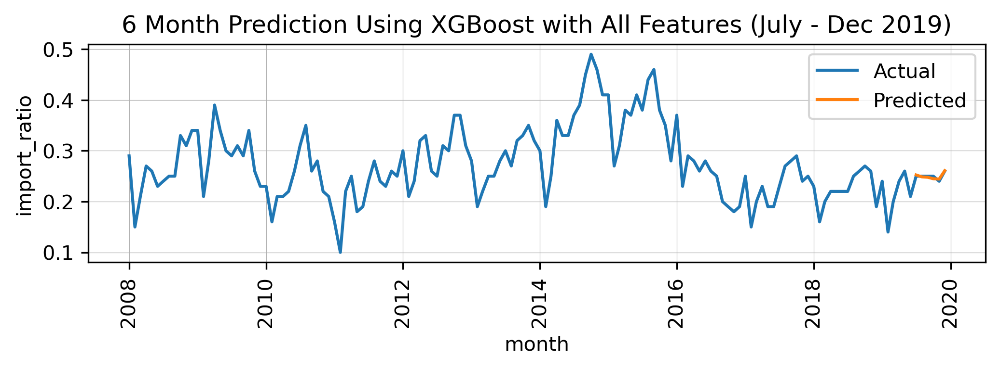

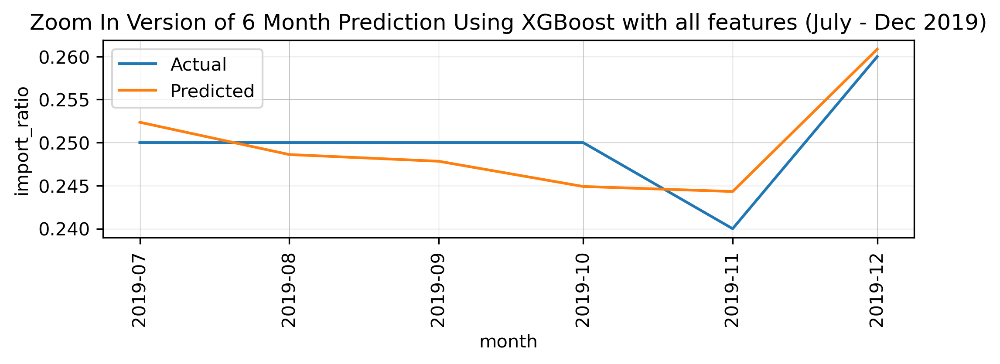

In [89]:
# HAS OUTLIER - all feature
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=combined_data1, x='month', y='import_ratio')
sns.lineplot(data=test_df1, x='month', y='predictions').set_title("6 Month Prediction Using XGBoost with All Features (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

# zoom in
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=test_df1, x='month', y='import_ratio')
sns.lineplot(data=test_df1, x='month', y='predictions').set_title("Zoom In Version of 6 Month Prediction Using XGBoost with all features (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)


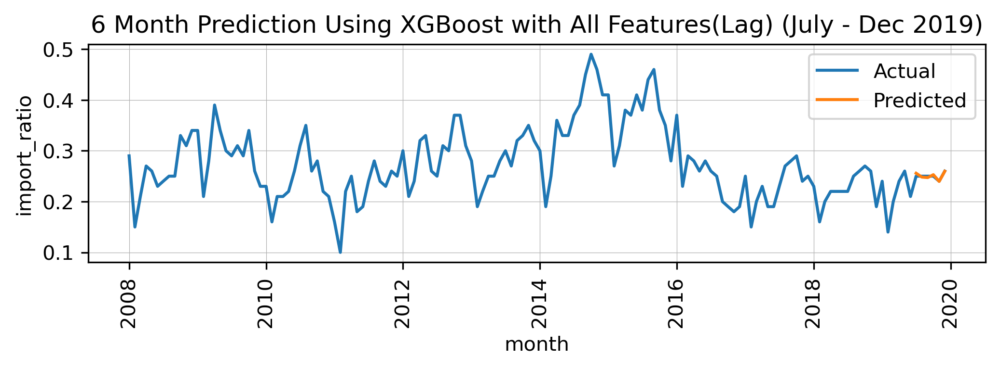

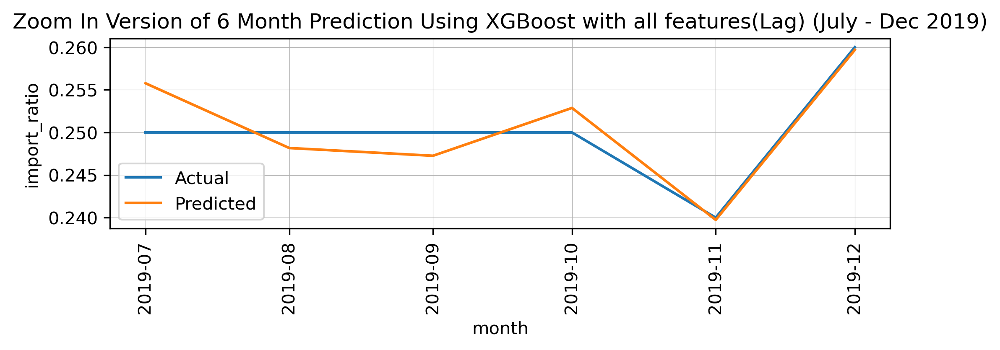

In [88]:
# HAS OUTLIER - all feature + LAG
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=combined_data1_lag, x='month', y='import_ratio')
sns.lineplot(data=test_df1_lag, x='month', y='predictions').set_title("6 Month Prediction Using XGBoost with All Features(Lag) (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

# zoom in
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=test_df1_lag, x='month', y='import_ratio')
sns.lineplot(data=test_df1_lag, x='month', y='predictions').set_title("Zoom In Version of 6 Month Prediction Using XGBoost with all features(Lag) (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)



In [45]:
sel_df1 = selected_df1
sel_test_df1 = selected_test_df1

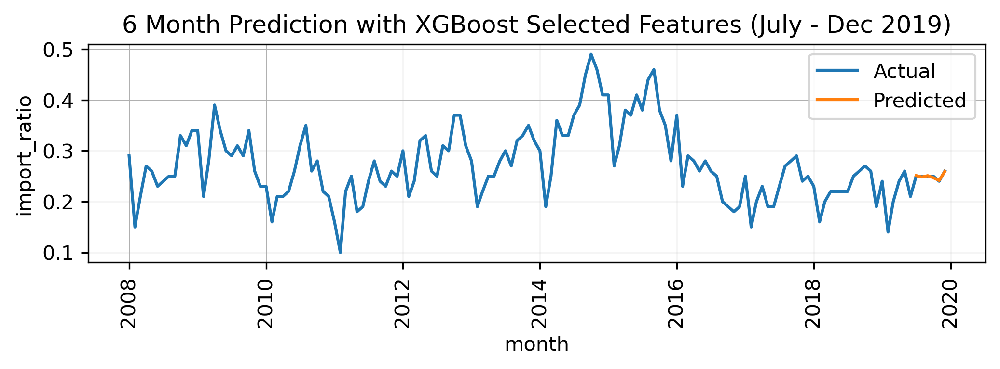

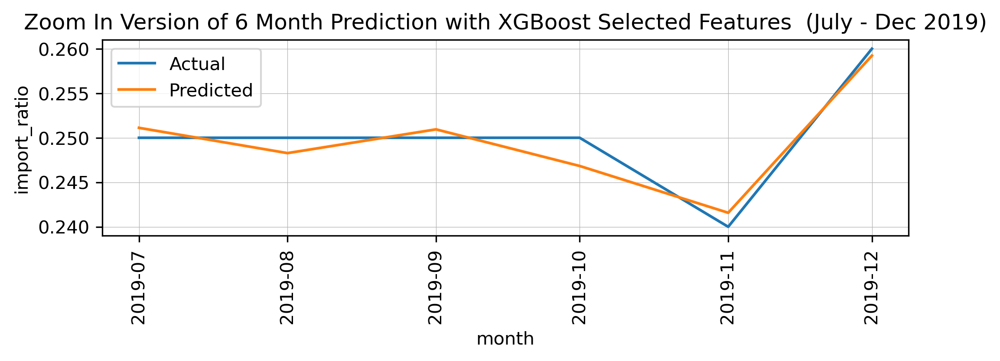

In [87]:
# HAS OUTLIER - selected features(8)
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=sel_df1, x='month', y='import_ratio')
sns.lineplot(data=sel_test_df1, x='month', y='predictions').set_title("6 Month Prediction with XGBoost Selected Features (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

# zoom in
# simple one
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=sel_test_df1, x='month', y='import_ratio')
sns.lineplot(data=sel_test_df1, x='month', y='predictions').set_title("Zoom In Version of 6 Month Prediction with XGBoost Selected Features  (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

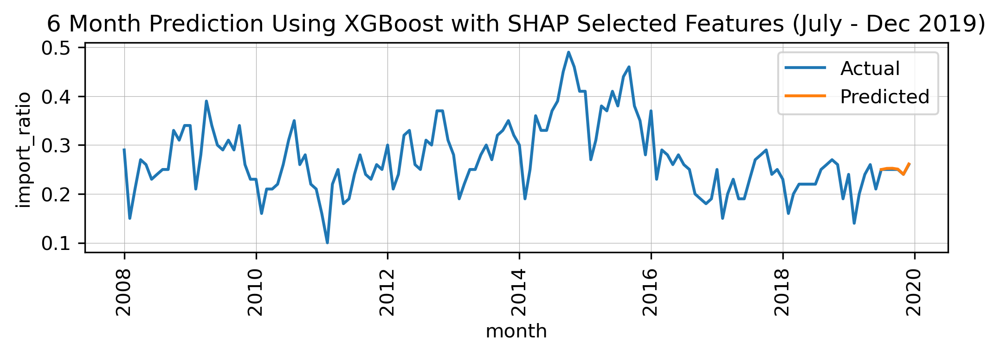

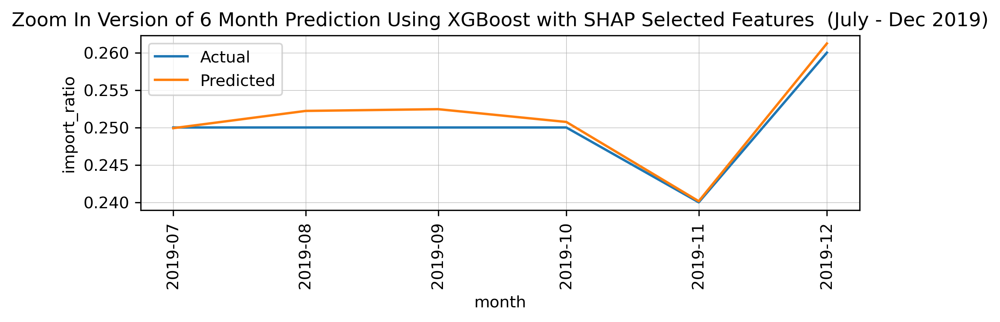

In [86]:
# HAS OUTLIER - shap selected features(6)
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=selected_df1, x='month', y='import_ratio')
sns.lineplot(data=selected_test_df1, x='month', y='predictions').set_title("6 Month Prediction Using XGBoost with SHAP Selected Features (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

# zoom in
# simple one
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=selected_test_df1, x='month', y='import_ratio')
sns.lineplot(data=selected_test_df1, x='month', y='predictions').set_title("Zoom In Version of 6 Month Prediction Using XGBoost with SHAP Selected Features  (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

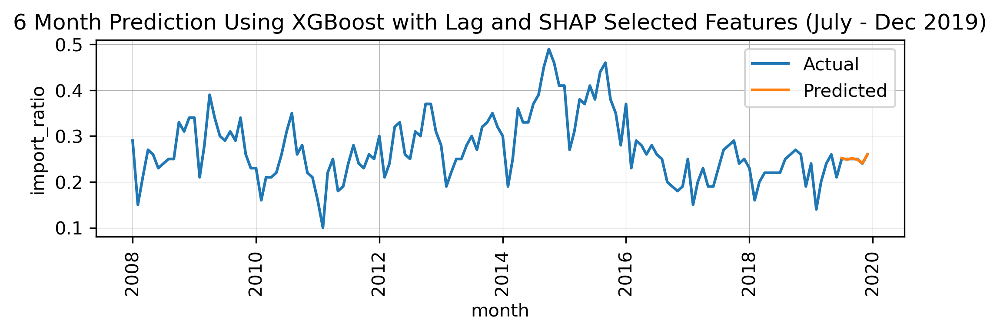

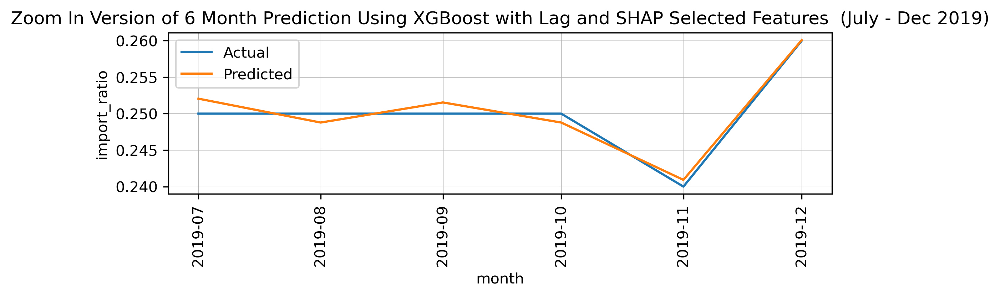

In [85]:
# HAS OUTLIER & Lag feature + shap selected features(6)
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=best_lag1, x='month', y='import_ratio')
sns.lineplot(data=best_test_df1_lag, x='month', y='predictions').set_title("6 Month Prediction Using XGBoost with Lag and SHAP Selected Features (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

# zoom in
# simple one
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=best_test_df1_lag, x='month', y='import_ratio')
sns.lineplot(data=best_test_df1_lag, x='month', y='predictions').set_title("Zoom In Version of 6 Month Prediction Using XGBoost with Lag and SHAP Selected Features  (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

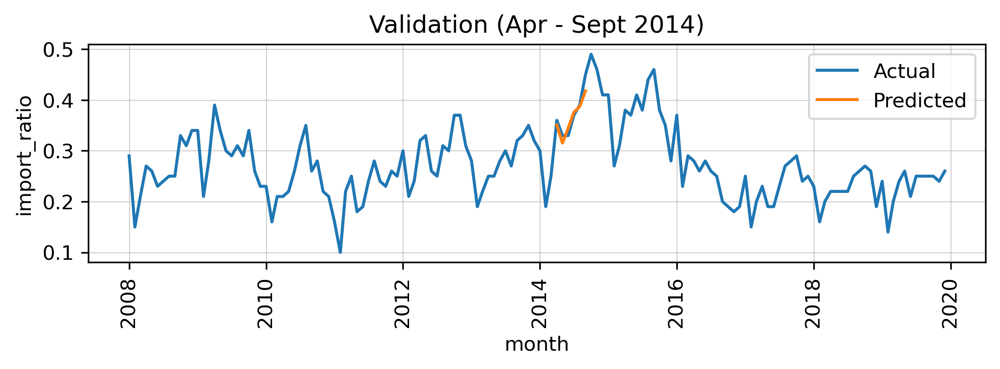

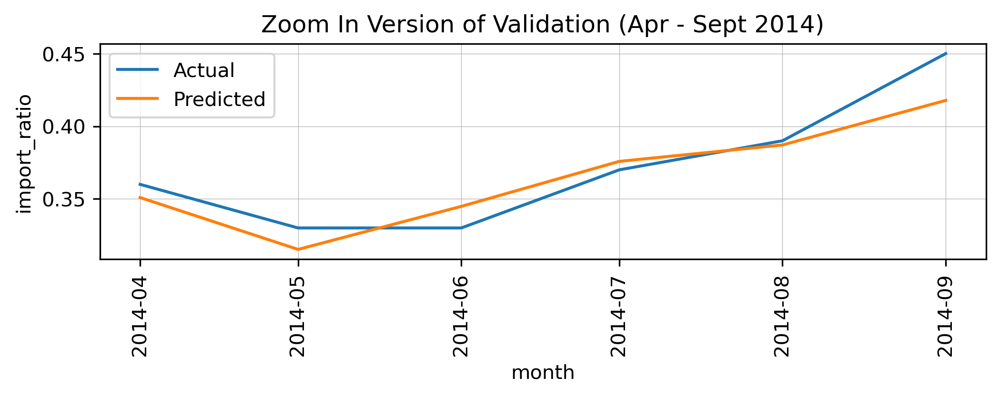

In [106]:
# HAS OUTLIER & Lag feature + shap selected features(6) & validation
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=best_lag1, x='month', y='import_ratio')
sns.lineplot(data=val_df1_lag, x='month', y='predictions').set_title("Validation (Apr - Sept 2014)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

# zoom in
# simple one
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=val_df1_lag, x='month', y='import_ratio')
sns.lineplot(data=val_df1_lag, x='month', y='predictions').set_title("Zoom In Version of Validation (Apr - Sept 2014)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

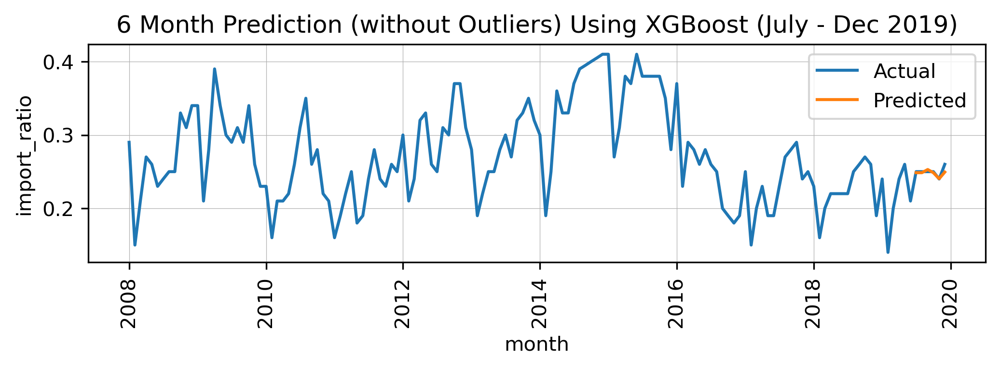

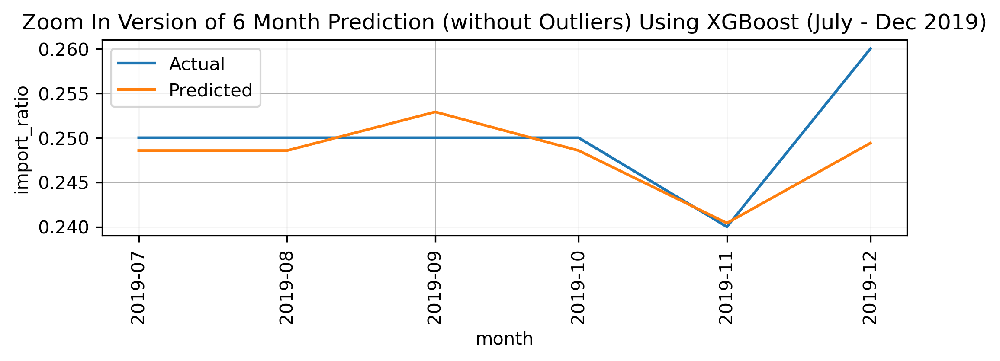

In [83]:
# _no_outlier simple one
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=month_df, x='month', y='import_ratio')
sns.lineplot(data=test_no_outlier1, x='month', y='predictions').set_title("6 Month Prediction (without Outliers) Using XGBoost (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

# zoom in
# simple one
plt.rcParams.update({'figure.figsize': (8, 2), 'figure.dpi':300})
fig, ax = plt.subplots()
sns.lineplot(data=test_no_outlier1, x='month', y='import_ratio')
sns.lineplot(data=test_no_outlier1, x='month', y='predictions').set_title("Zoom In Version of 6 Month Prediction (without Outliers) Using XGBoost (July - Dec 2019)")
ax.legend(['Actual', 'Predicted'])
plt.grid(linestyle='-', linewidth=0.3)
ax.tick_params(axis='x', rotation=90)

## Model Output Explaination Using Shap

Because the Tree SHAP algorithm is implemented in XGBoost we can compute exact SHAP values quickly over thousands of samples. The SHAP values for a single prediction (including the expected output in the last column) sum to the model's output for that prediction.

The below explanation shows features each contributing to push the model output from the base value (the average model output over the training dataset we passed) to the model output. Features pushing the prediction higher are shown in red, those pushing the prediction lower are in blue. Another way to visualize the same explanation is to use a force plot.

In [120]:
shap_values_has_outlier

.values =
array([[-1.9792086e-03, -4.0977914e-02,  1.0067558e-02,  9.0119671e-03,
        -1.6605369e-03, -3.7962659e-03, -4.9040676e-03, -3.5894436e-03,
         1.5535351e-03],
       [-1.8949541e-03, -4.0977914e-02,  5.9896200e-03,  5.2491352e-03,
         2.1022949e-03, -5.8335452e-03,  2.1515815e-03, -3.5894436e-03,
        -2.7416765e-03],
       [-3.2929364e-03, -4.0977914e-02,  2.6142714e-03,  5.2491352e-03,
         2.1022949e-03, -7.0056696e-03,  4.5771301e-03, -4.7921622e-03,
         4.7356226e-03],
       [-1.8949541e-03, -4.0977914e-02,  5.9896200e-03,  5.2491352e-03,
         2.1022949e-03, -5.8335452e-03,  2.1515815e-03, -3.5894436e-03,
        -2.7416765e-03],
       [-4.0027453e-03, -4.0977914e-02,  2.6142714e-03,  5.2491352e-03,
         2.1022949e-03, -7.0056696e-03,  2.1515815e-03, -4.7921622e-03,
        -2.7416765e-03],
       [-1.7268583e-05, -4.0977914e-02,  1.5478199e-02,  5.2491352e-03,
         2.1022949e-03, -3.2861601e-03, -2.3052664e-03, -3.5894436e-03,
 

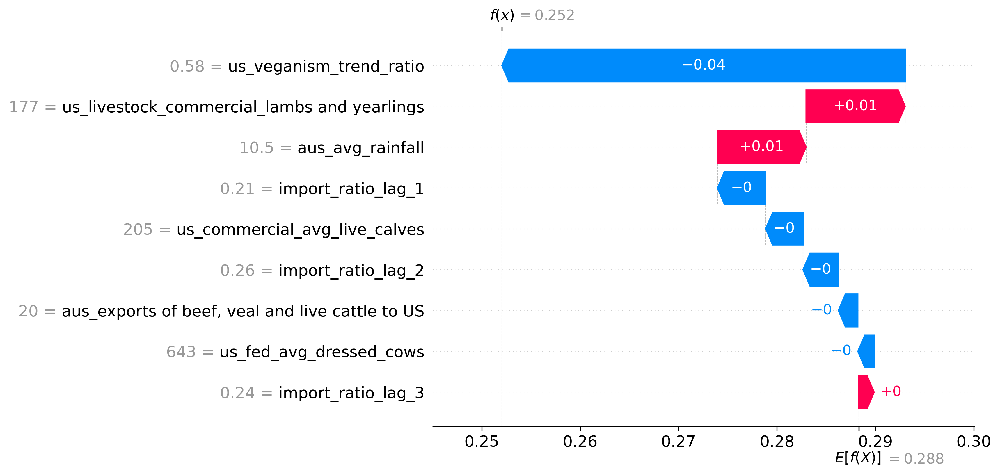

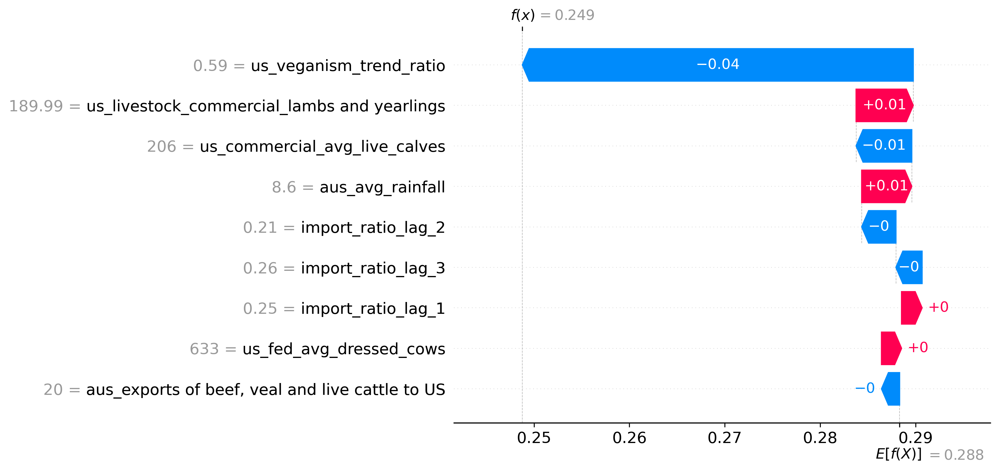

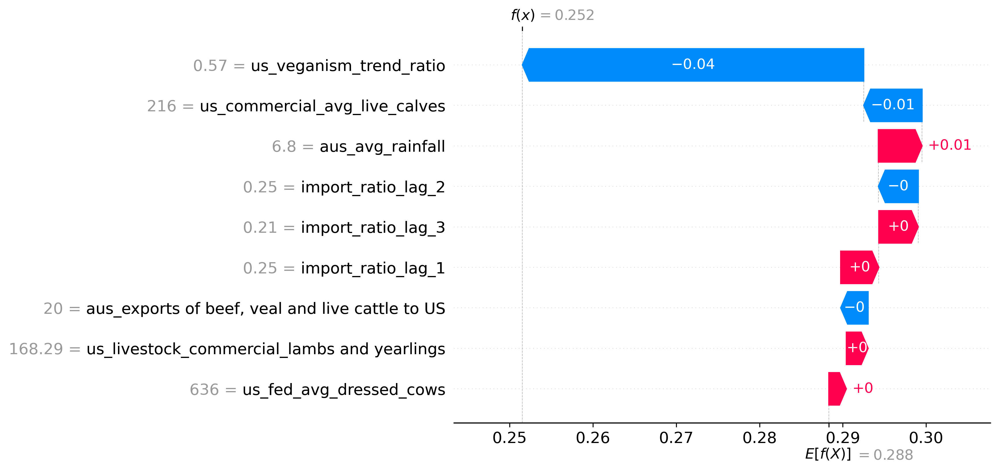

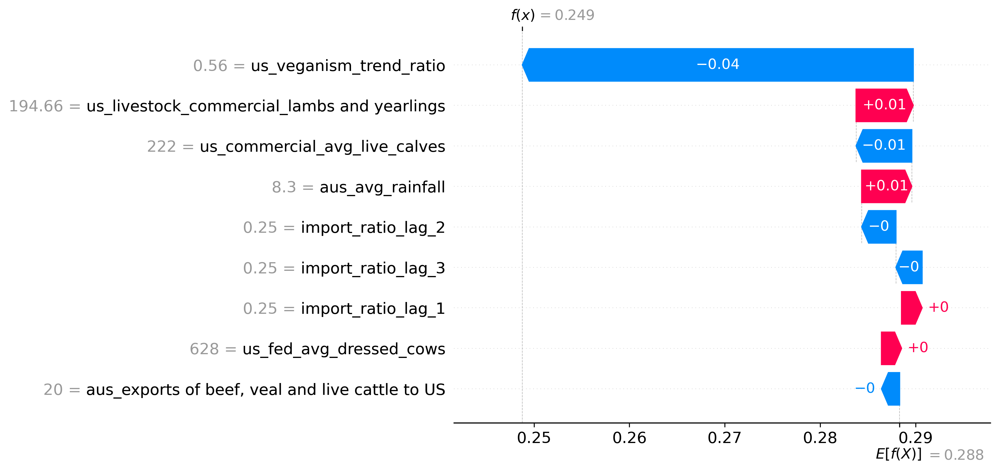

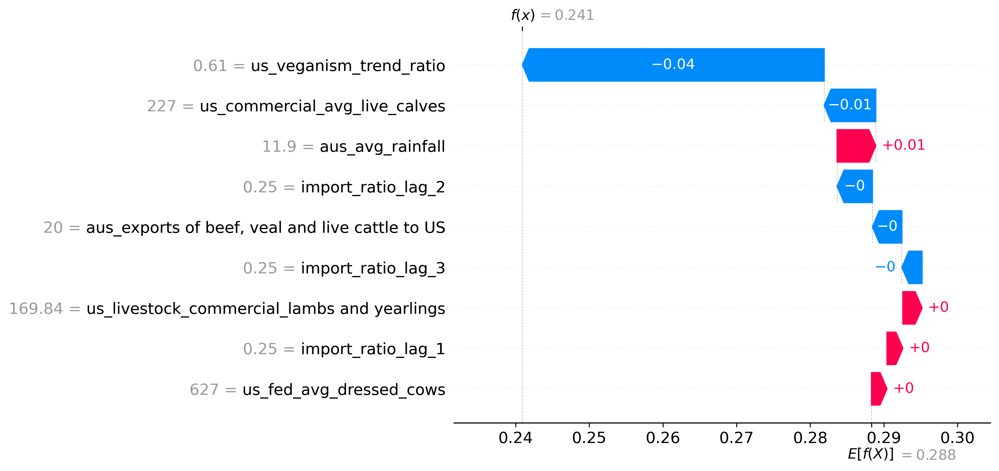

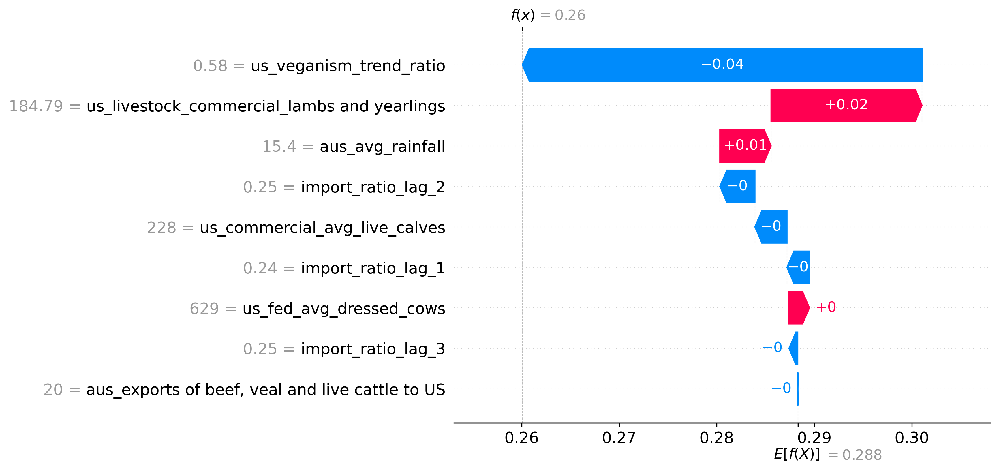

In [108]:
# compute the SHAP values for every prediction in the validation dataset
explainer_has_outlier = shap.TreeExplainer(best_model)
shap_values_has_outlier = explainer_has_outlier(best_X_test_lag)
#shap_values = explainer.shap_values(X_importance)

# visualize the first prediction's explanation
shap.plots.waterfall(shap_values_has_outlier[0])
shap.plots.waterfall(shap_values_has_outlier[1])
shap.plots.waterfall(shap_values_has_outlier[2])
shap.plots.waterfall(shap_values_has_outlier[3])
shap.plots.waterfall(shap_values_has_outlier[4])
shap.plots.waterfall(shap_values_has_outlier[5])

In [56]:
#shap.force_plot(explainer_has_outlier.expected_value, shap_values_has_outlier.values[1,:], X_test.iloc[1,:])

In [112]:
# visualize a single(first) prediction's explanation with a force plot
shap.plots.force(shap_values_has_outlier[0])

In [113]:
shap.plots.force(shap_values_has_outlier[1])

In [114]:
shap.plots.force(shap_values_has_outlier[2])

In [115]:
shap.plots.force(shap_values_has_outlier[3])

In [116]:
shap.plots.force(shap_values_has_outlier[4])

In [117]:
shap.plots.force(shap_values_has_outlier[5])

SHAP values sum to the difference between the expected output of the model and the current output for the current player. Note that for the Tree SHAP implmementation the margin output of the model is explained, not the transformed output (such as a probability for logistic regression). This means that the units of the SHAP values for this model are log odds ratios. Large positive values mean the import ratio is more likely to increase, while large negative values mean the import ratio is more likely to decrease.

## visualize all the test set predictions
If we take many force plot explanations such as the one shown above, rotate them 90 degrees, and then stack them horizontally, we can see explanations for an entire dataset (in the notebook this plot is interactive):



In [ ]:
# visualize all the test set predictions
shap.plots.force(explainer_has_outlier.expected_value, shap_values_has_outlier.values, X_test)
#pred_plot.figure.savefig("all_test_pred.pdf", format='pdf', dpi=1000, bbox_inches='tight')
#shap.force_plot(explainer.expected_value, shap_values[0, :], X_sample.iloc[0, :], matplotlib=True, show=False)
#plt.savefig('force_plot.png')

## Summarize the impact of all features over the entire dataset

A SHAP value for a feature of a specific prediction represents how much the model prediction changes when we observe that feature. In the summary plot below we plot all the SHAP values for a single feature on a row, where the x-axis is the SHAP value. By doing this for all features, we see which features drive the model's prediction a lot (such as us_total_red meat), and which only effect the prediction a little. Note that when points don't fit together on the line they pile up vertically to show density. Each dot is also colored by the value of that feature from high to low.

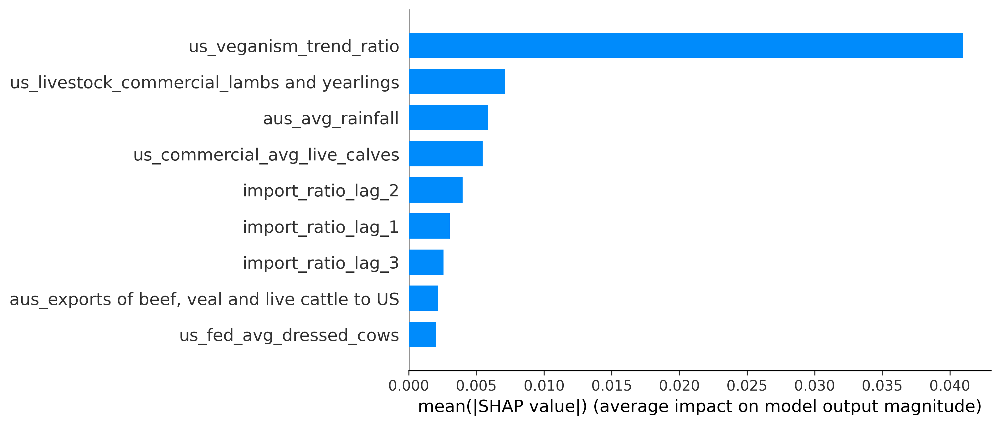

In [118]:
shap.summary_plot(shap_values_has_outlier, best_X_test_lag,plot_type="bar", show=False)
plt.savefig("6M_shap_summary_plot.pdf", format='pdf', dpi=1000, bbox_inches='tight')

In [119]:
def global_shap_importance(model, X):
    """ Return a dataframe containing the features sorted by Shap importance
    Parameters
    ----------
    model : The tree-based model 
    X : pd.Dataframe
         training set/test set/the whole dataset ... (without the label)
    Returns
    -------
    pd.Dataframe
        A dataframe containing the features sorted by Shap importance
    """
    explainer = shap.Explainer(model)
    shap_values = explainer(X)
    cohorts = {"": shap_values}
    cohort_labels = list(cohorts.keys())
    cohort_exps = list(cohorts.values())
    for i in range(len(cohort_exps)):
        if len(cohort_exps[i].shape) == 2:
            cohort_exps[i] = cohort_exps[i].abs.mean(0)
    features = cohort_exps[0].data
    feature_names = cohort_exps[0].feature_names
    values = np.array([cohort_exps[i].values for i in range(len(cohort_exps))])
    feature_importance = pd.DataFrame(
        list(zip(feature_names, sum(values))), columns=['features', 'importance'])
    feature_importance.sort_values(
        by=['importance'], ascending=False, inplace=True)
    return feature_importance

out1 = global_shap_importance(model_all_yes, X_test)
out1.to_csv("old_6m_shap_rank.csv")

## Decision plot

- The x-axis represents the model's output. In this case, the units are log odds.

- The plot is centered on the x-axis at explainer.expected_value. All SHAP values are relative to the model's expected value like a linear model's effects are relative to the intercept.

- The y-axis lists the model's features. By default, the features are ordered by descending importance. The importance is calculated over the observations plotted. 

- Each observation's prediction is represented by a colored line. At the top of the plot, each line strikes the x-axis at its corresponding observation's predicted value. This value determines the color of the line on a spectrum.

- Moving from the bottom of the plot to the top, SHAP values for each feature are added to the model's base value. This shows how each feature contributes to the overall prediction.

- At the bottom of the plot, the observations converge at explainer.expected_value.


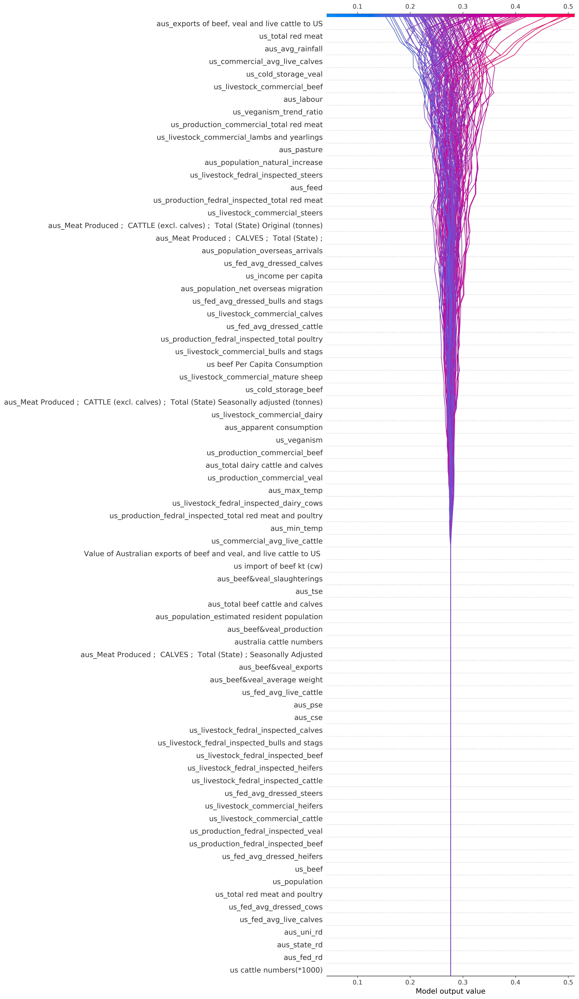

In [185]:
shap.decision_plot(explainer_has_outlier.expected_value, explainer_has_outlier.shap_values(X_train), X_train,
                   feature_display_range=slice(None, None, -1))